In [1]:
#fibonacci spirals
# goal: calculate phi with random numbers, using the fact that it is approximated by outer spirals / inner spirals

In [10]:
import numpy as np
from scipy.signal import correlate2dt
from scipy.stats import multivariate_normal
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import matplotlib as mpl
from matplotlib.animation import FuncAnimation
from cmath import rect, phase, exp
from math import log

%config InlineBackend.figure_format = 'retina'
mpl.rcParams['figure.figsize'] = 8, 8

In [16]:
# assuming plants don't have a fibonacci gene.
# what happens if they just put the next seeds after a random turn?
# https://youtu.be/14-NdQwKz9w

In [2]:
theta = np.zeros(4)
for i in range(1, 4):
    theta[i] = ((theta[:i] * (np.r_[:i] + 1)).sum() / (np.r_[:i] + 1).sum() + 2*np.pi) % (2*np.pi)

In [3]:
theta

array([0.        , 3.14159265, 5.23598776, 0.52359878])

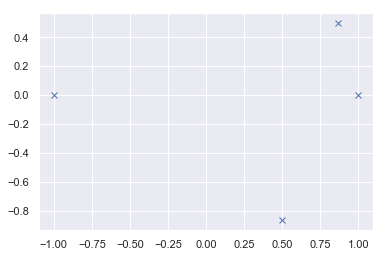

In [4]:
plt.figure()
plt.plot(np.cos(theta), np.sin(theta), 'x')

In [5]:

#for i in range(20):

flower

NameError: name 'flower' is not defined

In [6]:
%%capture

fig = plt.figure()
ln, = plt.plot([], [], 'x')
plt.axis('equal')
plt.axis([-1000, 1000, -1000, 1000])

flower = np.random.rand(10, 2) - 0.5
flower

def draw(t):
    global flower
#    print(flower)
    t += 1
    for i, seed in enumerate(flower):
        diffs = seed - flower[np.r_[:len(flower)] != i]
        diff_norms = np.sqrt((diffs**2).sum(axis=1))[np.newaxis].T
        flower[i] += (np.sum(diffs / diff_norms**2)) * t**2
#        flower[i] += 1/100 * (np.sum(diffs / diff_norms**2) + seed / np.sqrt(seed @ seed)**2) * t**2
    if t % 20 == 0:
        flower = np.vstack((flower, np.random.rand(1, 2)))

    ln.set_data(flower[:, 0], flower[:, 1])
    return ln,

anim = FuncAnimation(fig, draw, 100, interval=50, blit=True)


In [7]:
anim    # Why are they only on this line, never 90° turned??

In [8]:
flower

array([[ 3.45271520e+03,  3.45313950e+03],
       [ 2.78931566e+03,  2.78996334e+03],
       [-1.10364293e+03, -1.10357677e+03],
       [ 2.22359947e+03,  2.22361119e+03],
       [ 1.21042197e+03,  1.20992899e+03],
       [ 1.71013170e+03,  1.71066318e+03],
       [-1.60690964e+03, -1.60667026e+03],
       [-3.39126038e+03, -3.39123168e+03],
       [-2.72304943e+03, -2.72364357e+03],
       [-2.15239452e+03, -2.15273302e+03],
       [ 7.47746093e+02,  7.47879295e+02],
       [-6.36412184e+02, -6.35510182e+02],
       [ 2.89430209e+02,  2.89482917e+02],
       [-1.71784626e+02, -1.71626215e+02],
       [ 3.87547238e-01,  1.19392045e-01]])

In [9]:
anim

In [10]:
%%capture
from matplotlib.animation import FuncAnimation

fig = plt.figure()
ln, = plt.plot([], [], 'x')
plt.axis('equal')
plt.axis([-1000, 1000, -1000, 1000])

flower = np.random.rand(10, 2)

def draw(t):
    global flower
    t += 1
    for i, seed in enumerate(flower):
        diffs = seed - flower[np.r_[:len(flower)] != i]
        diff_norms = np.sqrt((diffs**2).sum(axis=1))[np.newaxis].T
        flower[i] += 1/100 * (np.sum(diffs / diff_norms**2) - seed / np.sqrt(seed @ seed)) * t**2
    if t % 20 == 0:
        flower = np.vstack((flower, np.random.rand(1, 2)))

    ln.set_data(flower[:, 0], flower[:, 1])
    return ln,

anim = FuncAnimation(fig, draw, 100, interval=50, blit=True)
mpl.rc('animation', html='html5')

In [11]:
anim

In [2]:
# neuer versuch mit winkeln, jetzt komplexe zahlen

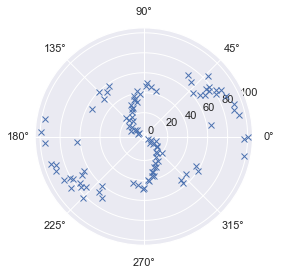

In [31]:
seeds = np.array([rect(1, 0)])

for i in range(1, 100):
    seeds += np.cos(np.angle(seeds)) + 1j*np.sin(np.angle(seeds))    # Growing
    best_angle = np.angle((seeds * (np.r_[:i] + 1)).sum()) + np.pi
    seeds = np.hstack((seeds, rect(1, best_angle + np.random.randn()/30)))

ax = plt.subplot(111, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), "x")
#ax.set_rmax(2)

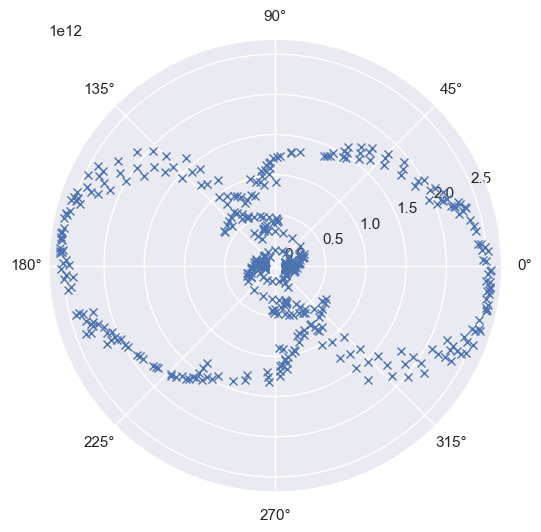

In [74]:
seeds = np.array([rect(1, 0)])

for i in range(1, 500):
    seeds += (np.r_[:i] + 1)**4 * (np.cos(np.angle(seeds)) + 1j*np.sin(np.angle(seeds)))    # Growing
    angle = np.angle((seeds * (np.r_[:i] + 1)).sum()) + np.pi + np.random.randn()/100
    seeds = np.hstack((seeds, rect(1, angle)))

ax = plt.subplot(111, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), "x")
#ax.set_rmax(2)

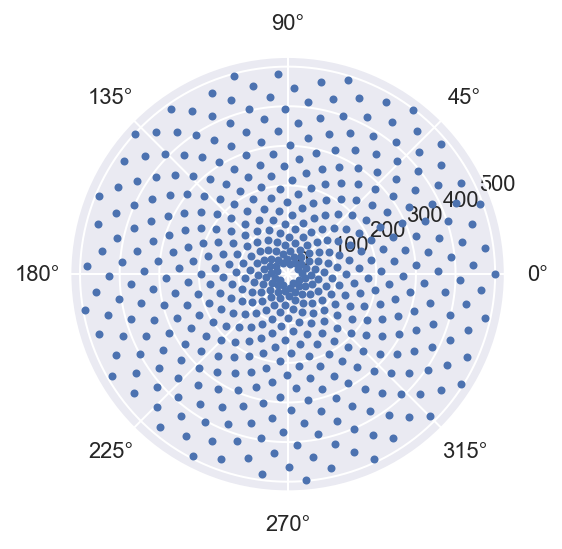

In [50]:
seeds = np.array([rect(1, 0)])

for i in range(1, 500):
    seeds += seeds / np.abs(seeds)    # Growing
    angle = phase(seeds[-1]) + np.pi*(3 - 5**.5)
    seeds = np.hstack((seeds, rect(1, angle)))

ax = plt.subplot(111, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), ".")
#ax.set_rmax(2)

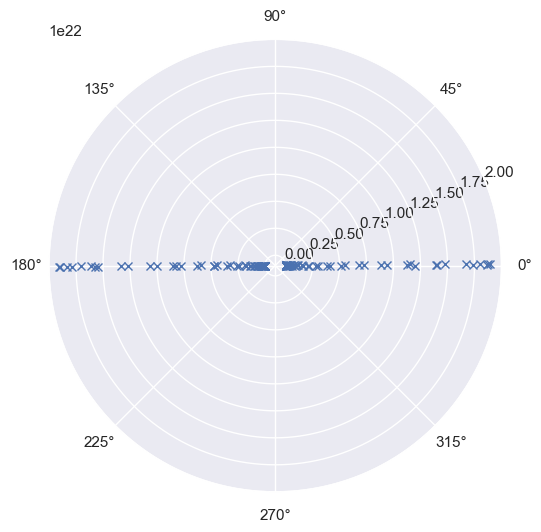

In [114]:
seeds = np.array([rect(1, 0)])

for i in range(1, 500):
    seeds += np.exp((np.r_[:i] + 1) / 10) * (np.cos(np.angle(seeds)) + 1j*np.sin(np.angle(seeds)))    # Growing
    best_angle = np.angle(((np.r_[i] + 1) * seeds).sum()) + np.pi
    seeds = np.hstack((seeds, rect(1, best_angle + np.random.randn()/1000)))

ax = plt.subplot(111, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), "x")
#ax.set_rmax(2)

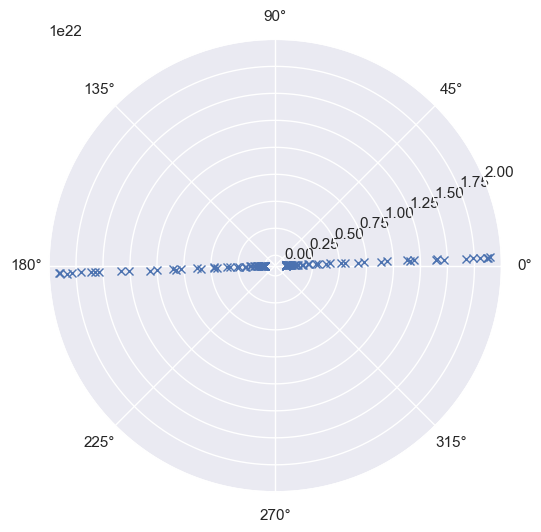

In [115]:
seeds = np.array([rect(1, 0)])

for i in range(1, 500):
    seeds += np.exp((np.r_[:i] + 1) / 10) * (np.cos(np.angle(seeds)) + 1j*np.sin(np.angle(seeds)))    # Growing
    best_angle = np.angle(((np.r_[i] + 1) * seeds).sum()) + np.pi
    seeds = np.hstack((seeds, rect(1, best_angle + np.random.randn()/1000)))

ax = plt.subplot(111, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), "x")
#ax.set_rmax(2)

In [38]:
phi = np.r_[0, np.pi]
a = 1
N = len(phi)
i = np.r_[1 : N+1]
f = np.vectorize(lambda x: 1/N**a * np.sum(i**a * np.exp(-(x - phi)**2)))
g = np.vectorize(lambda x: f(x + 2*np.pi) + f(x) + f(x - 2*np.pi))

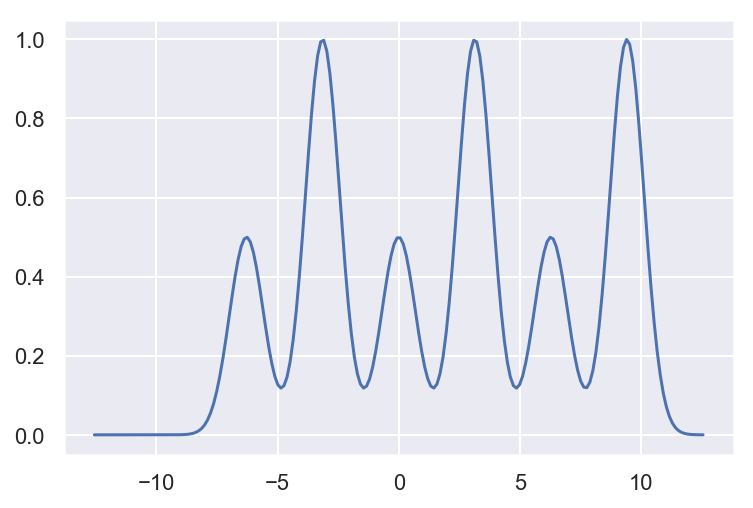

In [39]:
x = np.linspace(-4*np.pi, 4*np.pi, 200)
plt.plot(x, g(x))

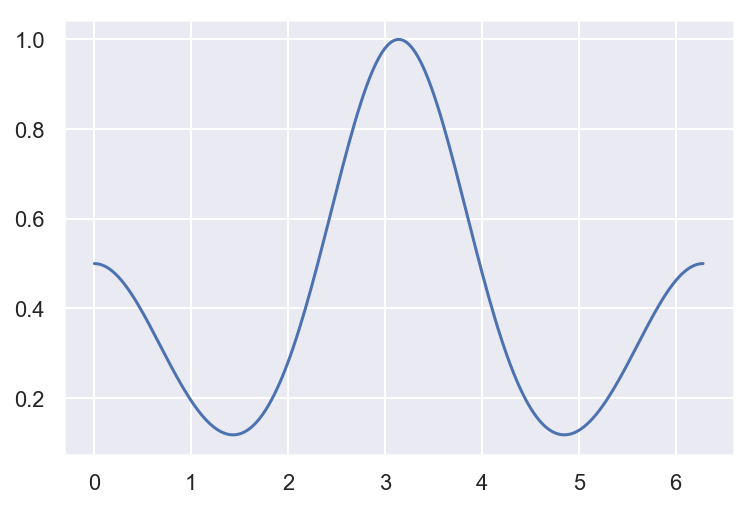

In [40]:
# field strength along circle
x = np.linspace(0, 2*np.pi, 200)
plt.plot(x, g(x))

In [43]:
x[np.argmin(g(x))]

4.862364509073649

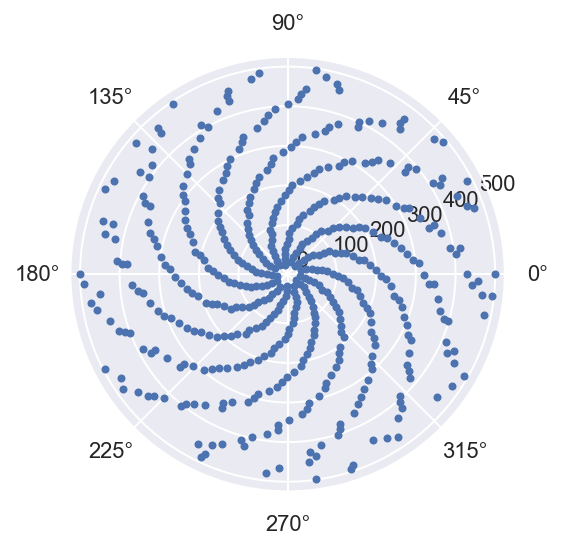

In [55]:
seeds = np.array([rect(1, 0)])

for i in range(1, 500):
    seeds += seeds / np.abs(seeds)    # Growing
    a = 1
    phi = np.angle(seeds)
    k = np.r_[1 : i+1]
    f = np.vectorize(lambda x: 1/i**a * np.sum(k**a * np.exp(-(x - phi)**2)))
    g = np.vectorize(lambda x: f(x + 2*np.pi) + f(x) + f(x - 2*np.pi))
    x = np.linspace(0, 2*np.pi, 1000)
    angle = x[np.argmin(g(x))]
    seeds = np.hstack((seeds, rect(1, angle)))

ax = plt.subplot(111, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), ".")

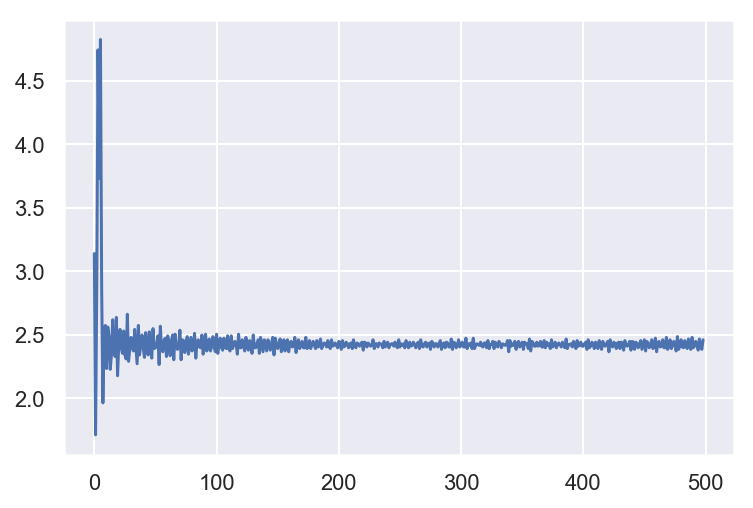

In [63]:
plt.plot((np.diff(np.angle(seeds)) + 2*np.pi) % (2*np.pi))

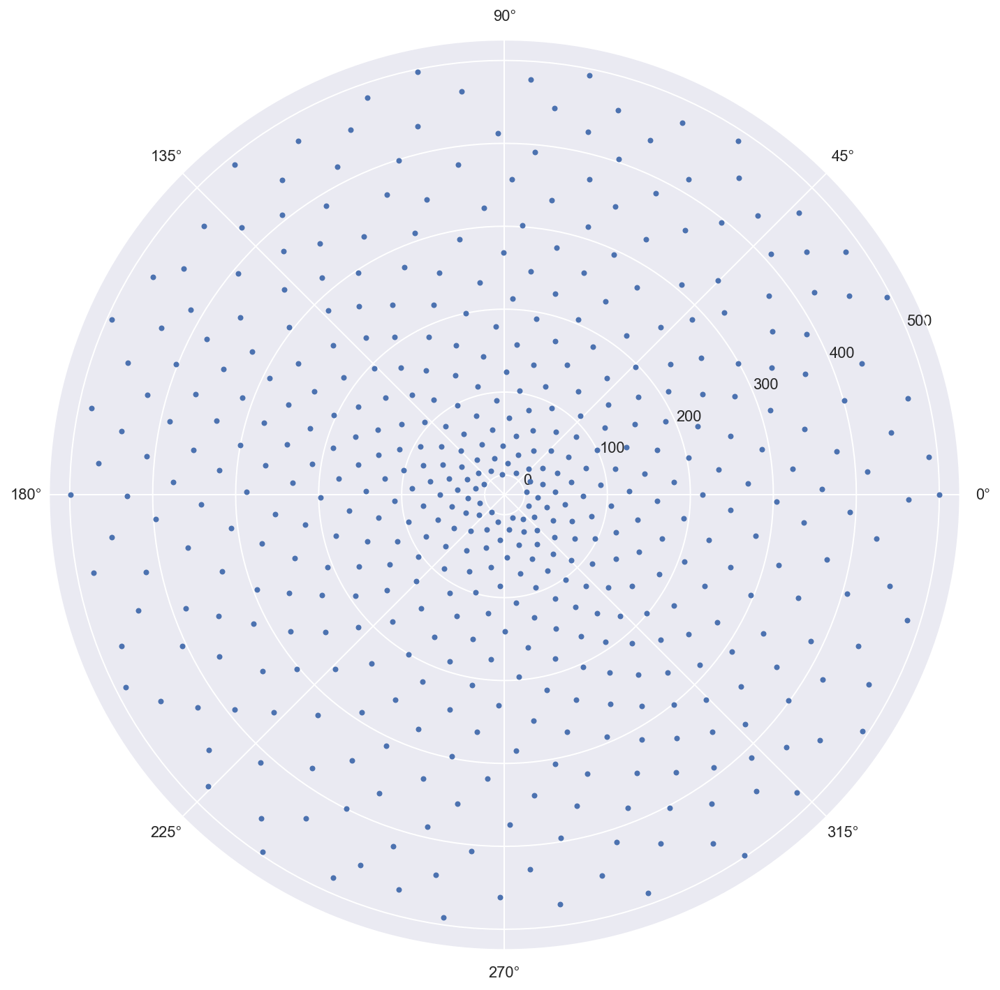

In [184]:
seeds = np.array([rect(1, 0)]) # , rect(1, np.random.randn()/20 + np.pi)
x = np.linspace(0, 2*np.pi, 10000)

def energy(x, a=1):
    N = len(seeds)
    i = np.r_['1,2', 1 : N+1].T
    phi = np.angle(seeds)[np.newaxis].T
    E = 1/N**a * (np.sum(i**a * np.exp(-((N - i + 1)*(x - phi))**2), axis=0)
                  + np.sum(i**a * np.exp(-((N - i + 1)*(x + 2*np.pi - phi))**2), axis=0)
                  + np.sum(i**a * np.exp(-((N - i + 1)*(x - 2*np.pi - phi))**2), axis=0))
    return E

for i in range(1, 500):
    seeds += seeds / np.abs(seeds)    # Growing np.exp(-(np.r_[i+1:1:-1]) / 100) * 
    angle = x[np.argmin(energy(x, a=2))]
    seeds = np.hstack((seeds, rect(1, angle)))
    

ax = plt.subplot(111, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), ".")

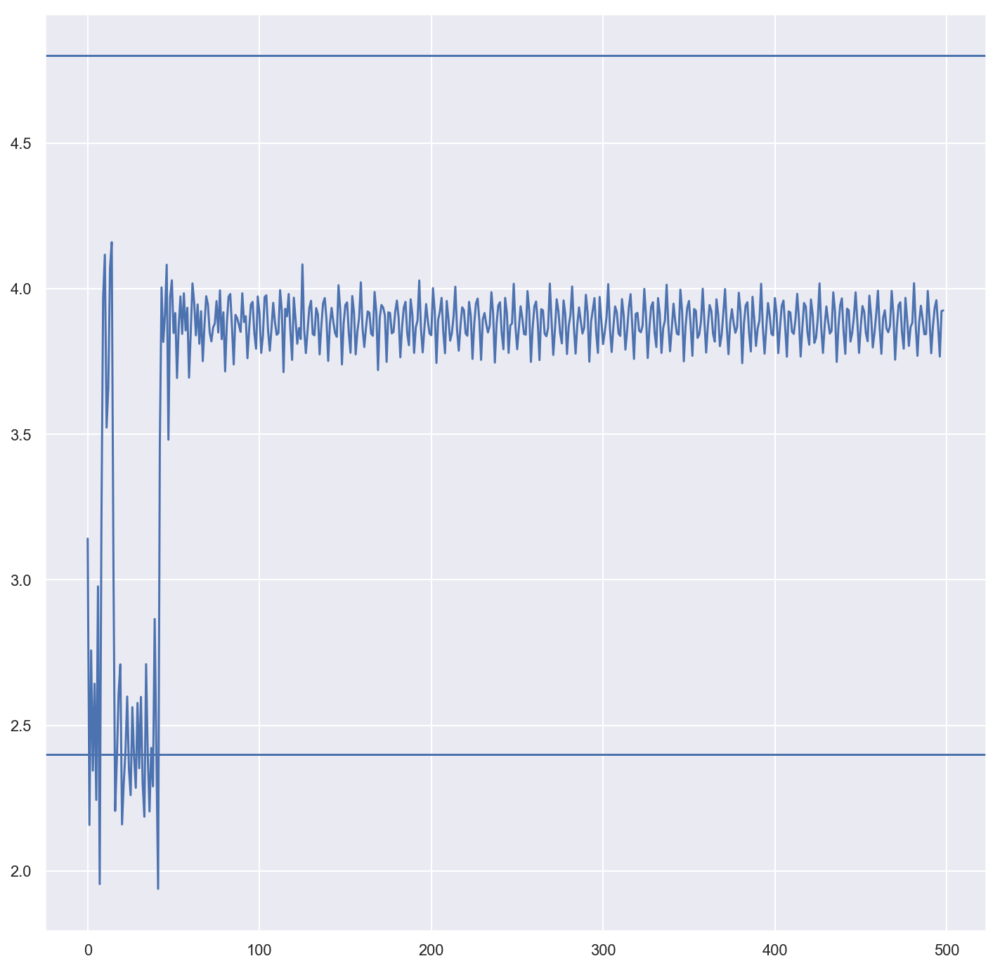

In [186]:
_,ax = plt.subplots()
ax.plot((np.diff(np.angle(seeds)) + 2*np.pi) % (2*np.pi))
ax.axhline(y=2*np.pi*(3 - 5**.5))
ax.axhline(y=np.pi*(3 - 5**.5))

In [188]:
angles = (np.diff(np.angle(seeds)) + 2*np.pi) % (2*np.pi)
angles[int(len(angles)/3):].mean()    # what is this??

3.8833232653085665

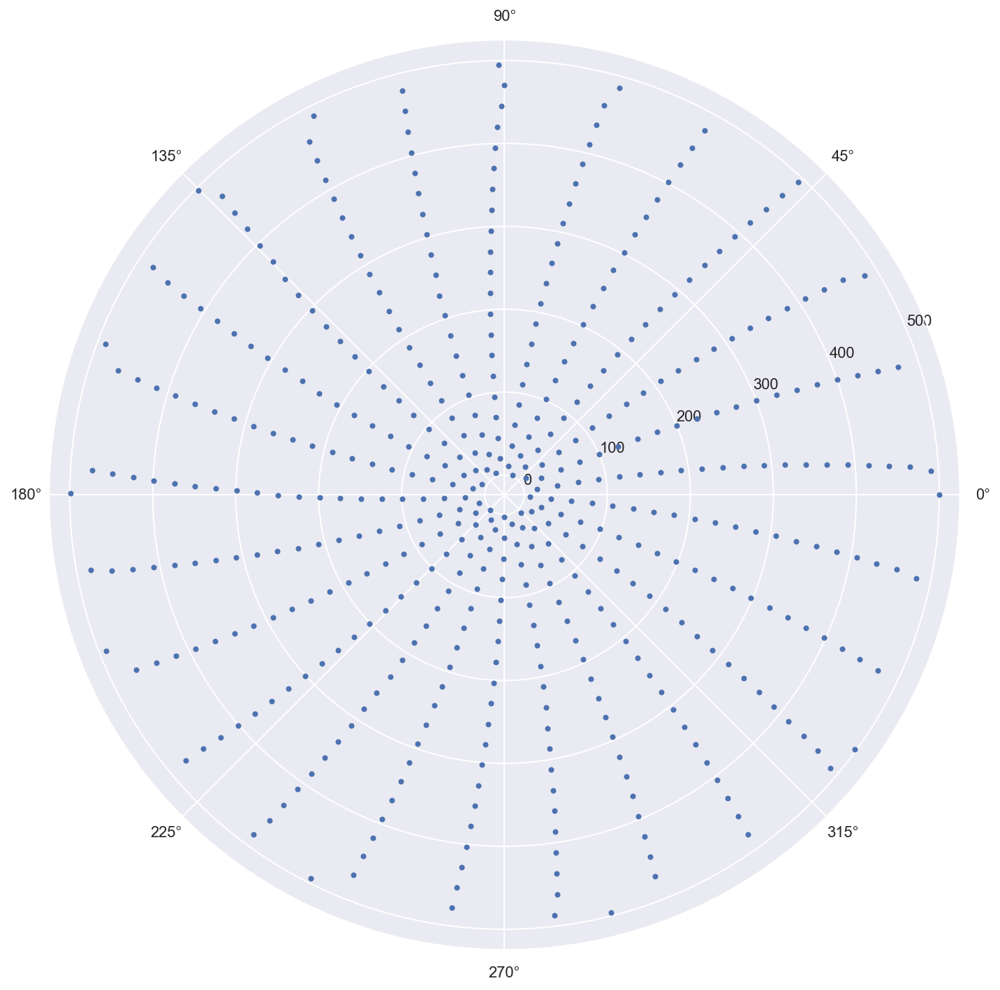

In [192]:
seeds = np.array([rect(1, 0)]) # , rect(1, np.random.randn()/20 + np.pi)
x = np.linspace(0, 2*np.pi, 1000)

def energy(x, a=1):
    N = len(seeds)
    i = np.r_['1,2', 1 : N+1].T
    phi = np.angle(seeds)[np.newaxis].T
    E = 1/N**a * (np.sum(i**a * np.exp(-(N - i + 1)**4 * (x - phi)**2), axis=0)
                  + np.sum(i**a * np.exp(-(N - i + 1)**4 * (x + 2*np.pi - phi)**2), axis=0)
                  + np.sum(i**a * np.exp(-(N - i + 1)**4 * (x - 2*np.pi - phi)**2), axis=0))
    return E

for i in range(1, 500):
    seeds += seeds / np.abs(seeds)    # Growing np.exp(-(np.r_[i+1:1:-1]) / 100) * 
    angle = x[np.argmin(energy(x, a=2))]
    seeds = np.hstack((seeds, rect(1, angle)))
    
ax = plt.subplot(111, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), ".")

Final angle 2.7648757789242855


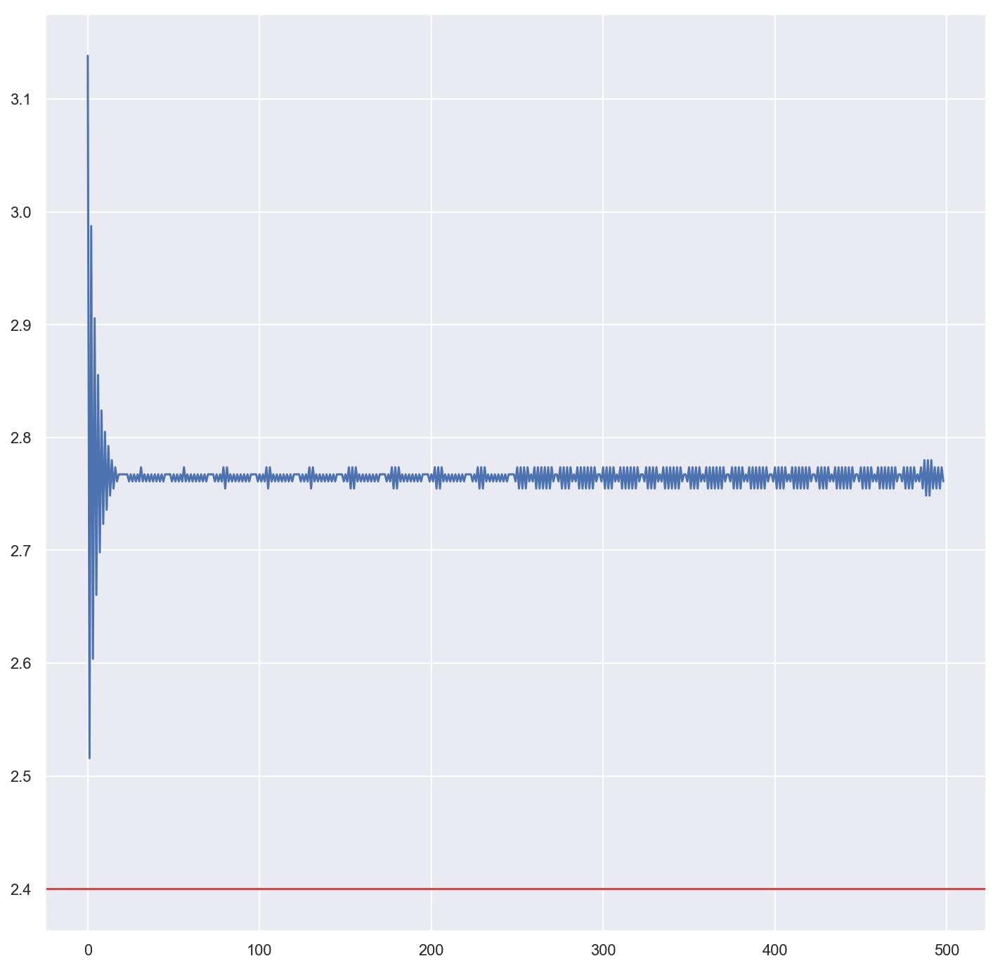

In [193]:
_,ax = plt.subplots()
angles = (np.diff(np.angle(seeds)) + 2*np.pi) % (2*np.pi)
ax.plot(angles)
ax.axhline(np.pi*(3 - 5**.5), color='r')
print("Final angle", angles[int(len(angles)/3):].mean())

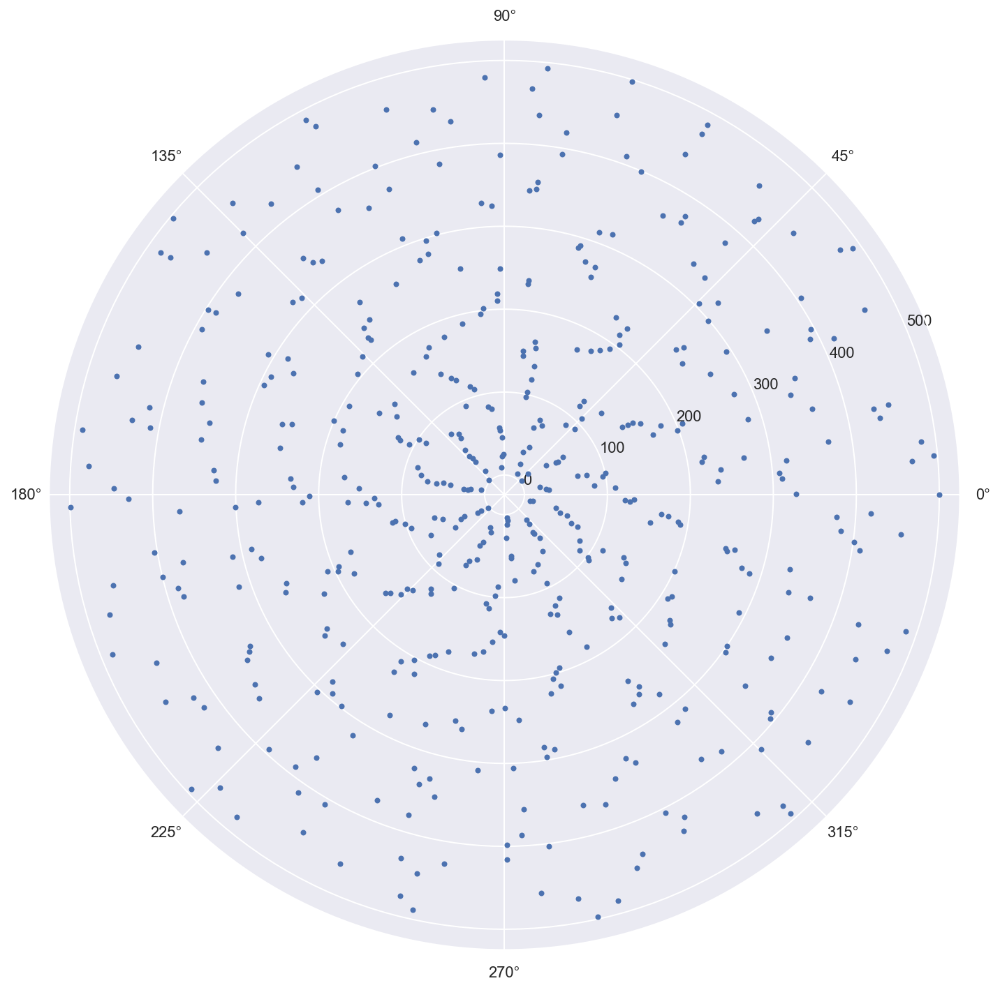

In [208]:
seeds = np.array([rect(2, 0), rect(1, np.random.randn()/20 + np.pi)])
x = np.linspace(0, 2*np.pi, 1000)

def energy(x, a=1):
    N = len(seeds)
    i = np.r_['1,2', 1 : N+1].T
    phi = np.angle(seeds)[np.newaxis].T
    E = 1/N**a * (np.sum(i**a * np.exp(-(N - i + 1)**.5 * (x - phi)**2), axis=0)
                  + np.sum(i**a * np.exp(-(N - i + 1)**.5 * (x + 2*np.pi - phi)**2), axis=0)
                  + np.sum(i**a * np.exp(-(N - i + 1)**.5 * (x - 2*np.pi - phi)**2), axis=0))
    return E

for i in range(2, 500):
    seeds += seeds / np.abs(seeds)    # Growing np.exp(-(np.r_[i+1:1:-1]) / 100) * 
    angle = x[np.argmin(energy(x, a=2))] + np.random.randn()/100
    seeds = np.hstack((seeds, rect(1, angle)))
    
ax = plt.subplot(111, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), ".")

Final angle 3.1369274661106945


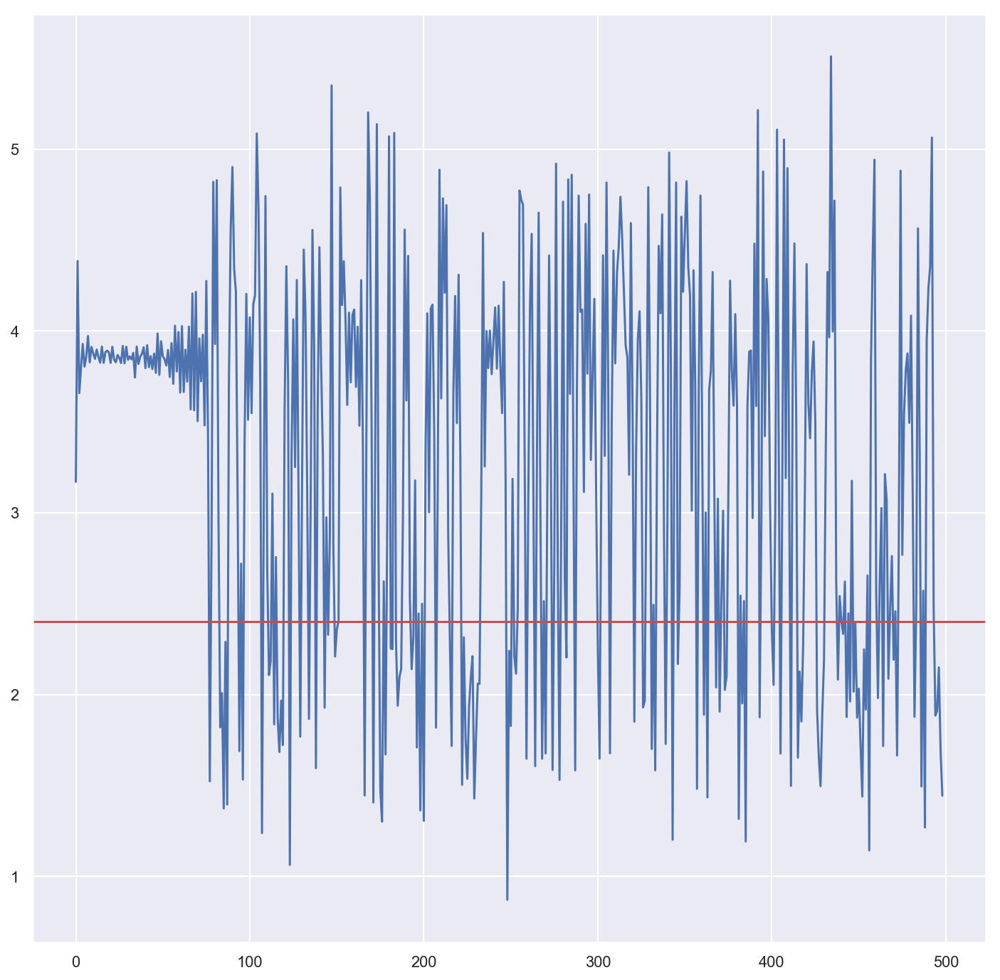

In [209]:
_,ax = plt.subplots()
angles = (np.diff(np.angle(seeds)) + 2*np.pi) % (2*np.pi)
ax.plot(angles)
ax.axhline(np.pi*(3 - 5**.5), color='r')
print("Final angle", angles[int(len(angles)/3):].mean())

In [210]:
# analysing the bifurcation

In [20]:
def test(a, b, M=1000):
    seeds = np.array([rect(1, 0)])
    x = np.linspace(0, 2*np.pi, M)

    def energy(x, a=1, b=2):
        N = len(seeds)
        i = np.r_['1,2', 1 : N+1].T
        phi = np.angle(seeds)[np.newaxis].T
        E = 1/N**a * (np.sum(i**a * np.exp(-(N - i + 1)**b * (x - phi)**2), axis=0)
                      + np.sum(i**a * np.exp(-(N - i + 1)**b * (x + 2*np.pi - phi)**2), axis=0)
                      + np.sum(i**a * np.exp(-(N - i + 1)**b * (x - 2*np.pi - phi)**2), axis=0))
        return E

    for i in range(2, 500):
        seeds += seeds / np.abs(seeds)    # Growing np.exp(-(np.r_[i+1:1:-1]) / 100) * 
        angle = x[np.argmin(energy(x, a=a, b=b))]# + np.random.randn()/100
        seeds = np.hstack((seeds, rect(1, angle)))

    ax = plt.subplot(221, projection='polar')
    ax.plot(np.angle(seeds), np.abs(seeds), ".")
    
    ax = plt.subplot(222, projection='polar')
    E = np.exp(1j * x) * energy(x, a=a, b=b)
    ax.plot(np.angle(E), np.abs(E))
    
    ax = plt.subplot(212)
    angles = (np.diff(np.angle(seeds)) + 2*np.pi) % (2*np.pi)
    ax.plot(angles)
    ax.axhline(np.pi*(3 - 5**.5), color='r')
    
    print("Final angle", angles[int(len(angles)/3):].mean())

Final angle 3.0807438794944297


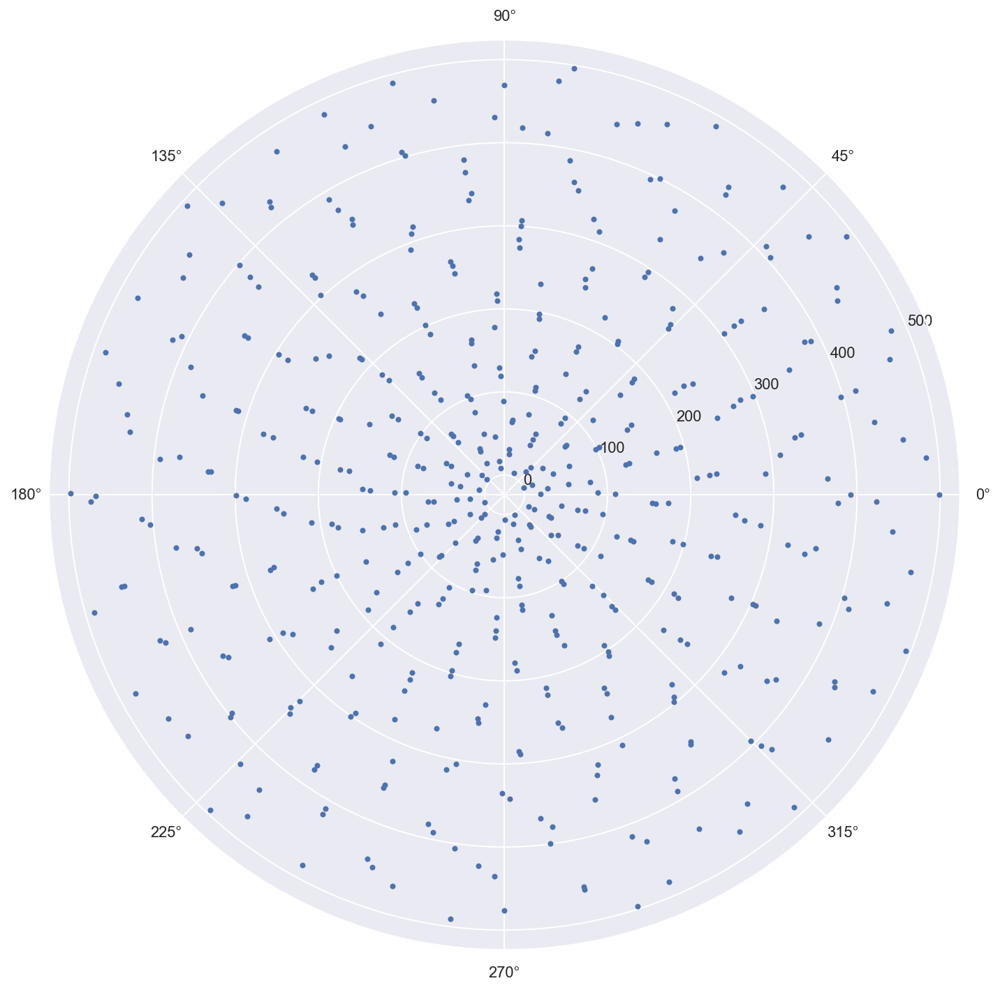

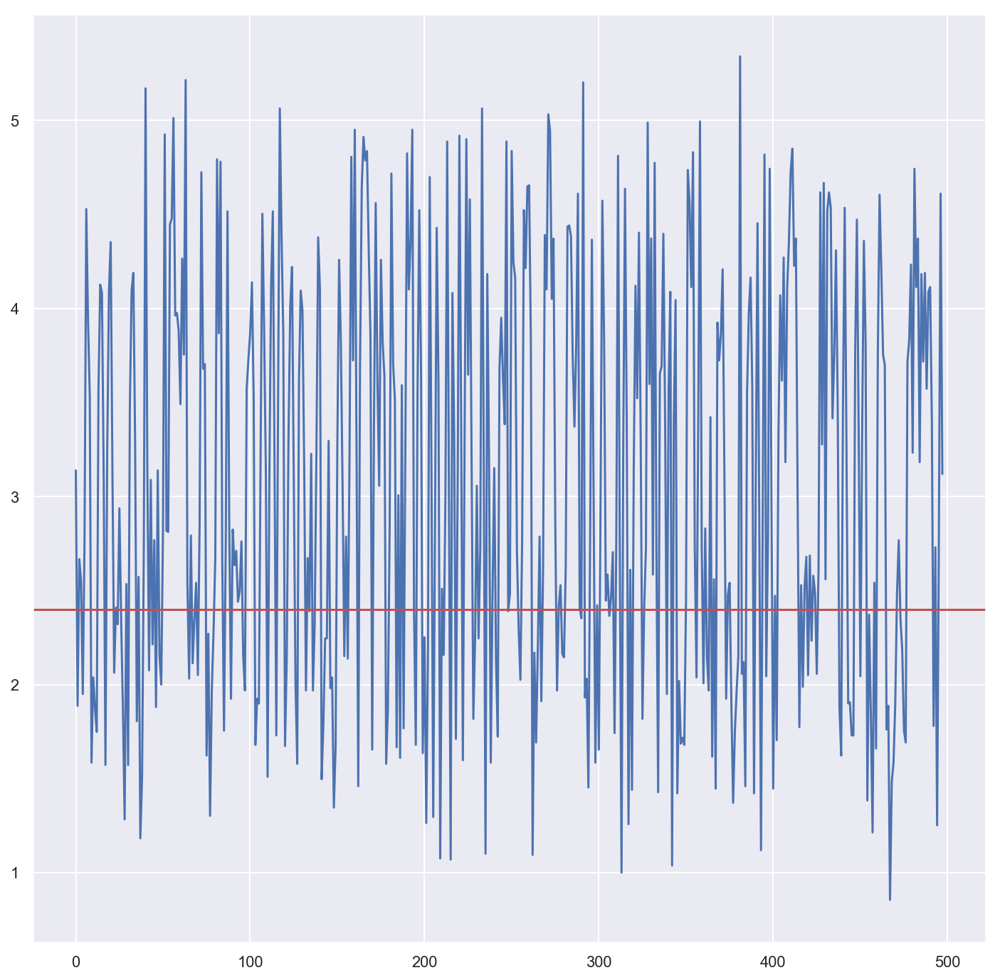

In [217]:
test(a=1, b=1)

Final angle 3.0813311497300955


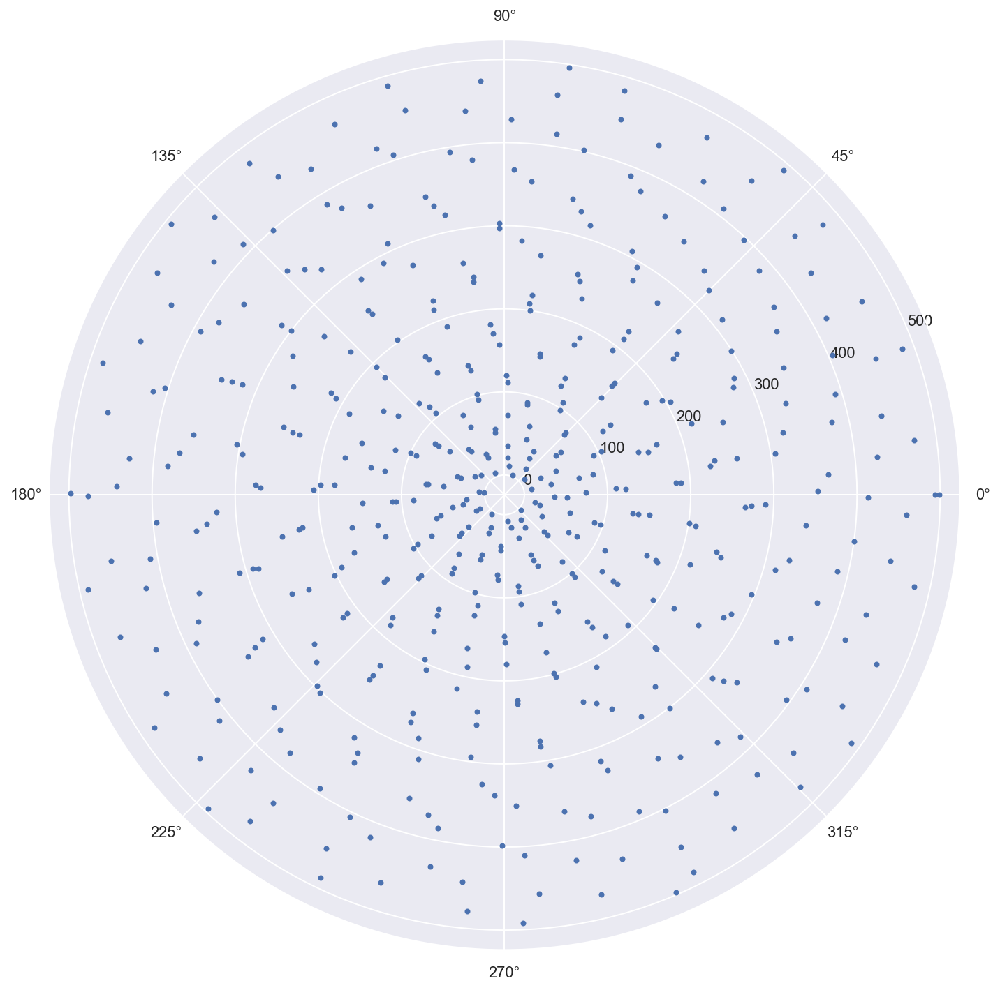

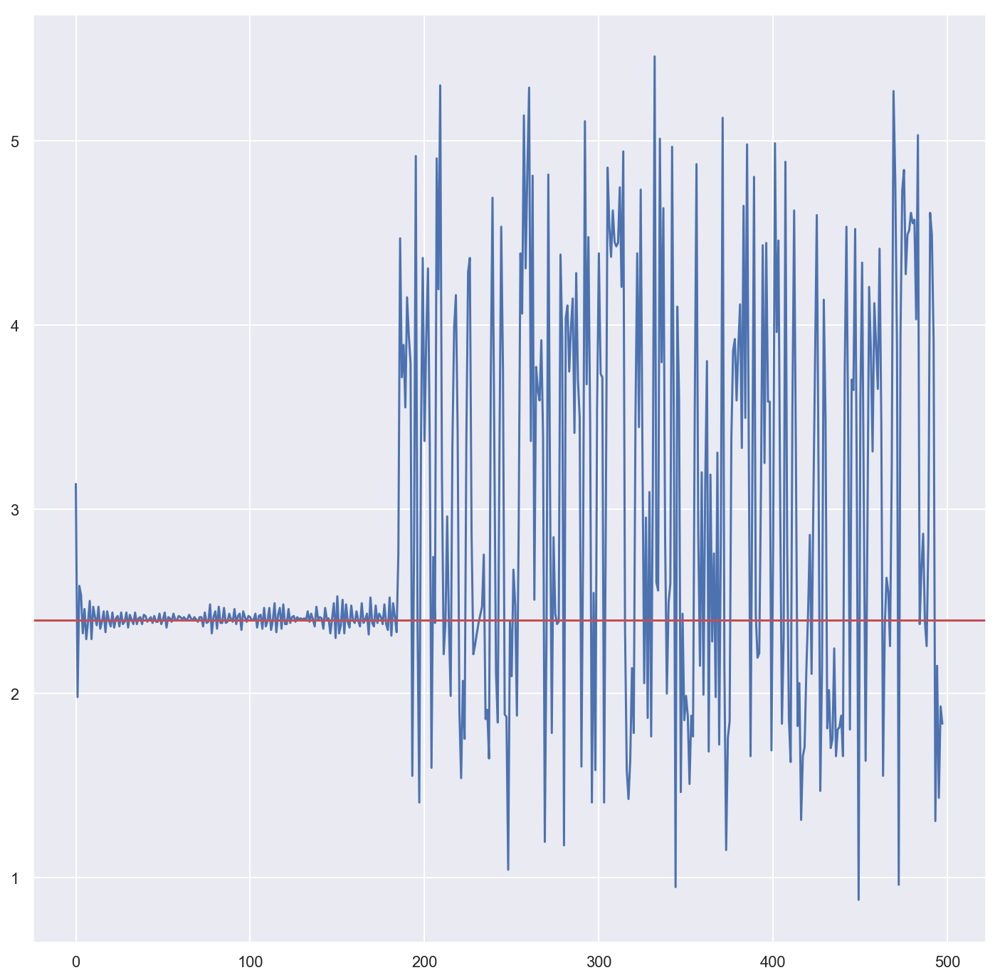

In [218]:
test(a=2, b=1)

Final angle 2.9365027319346253


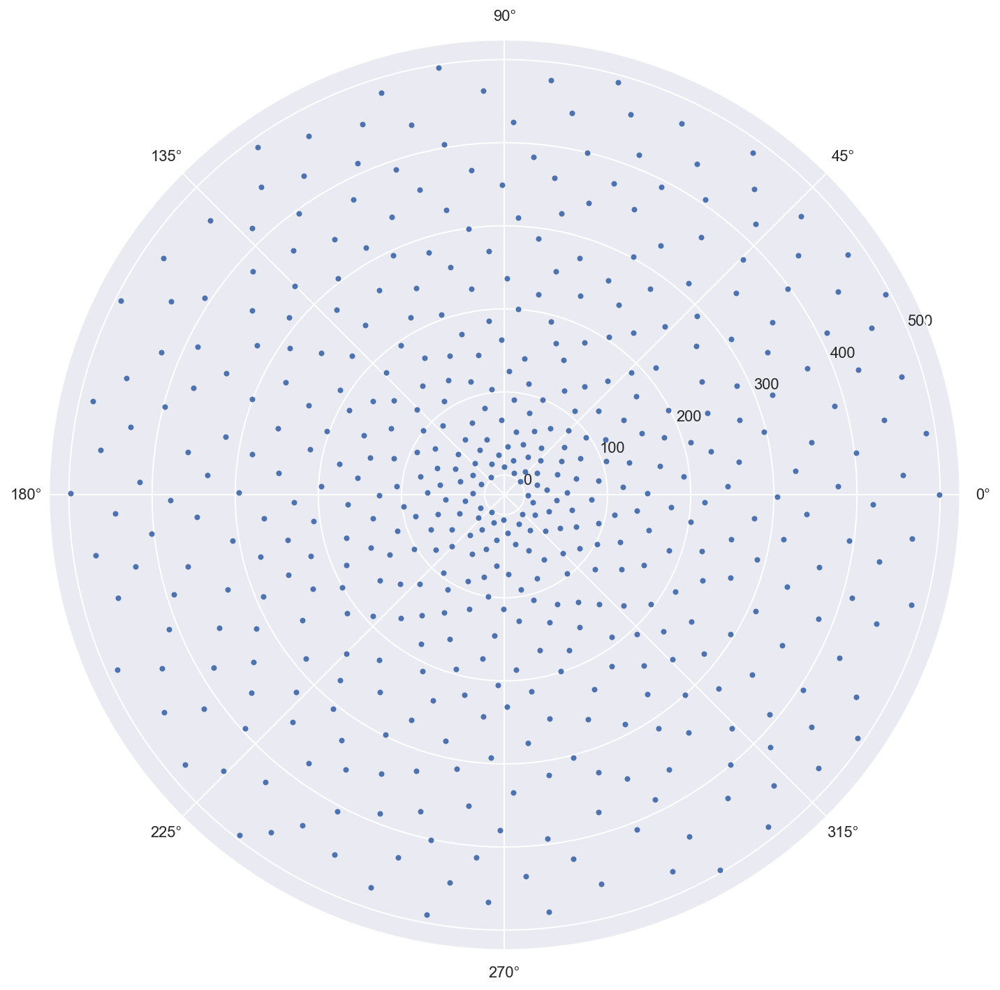

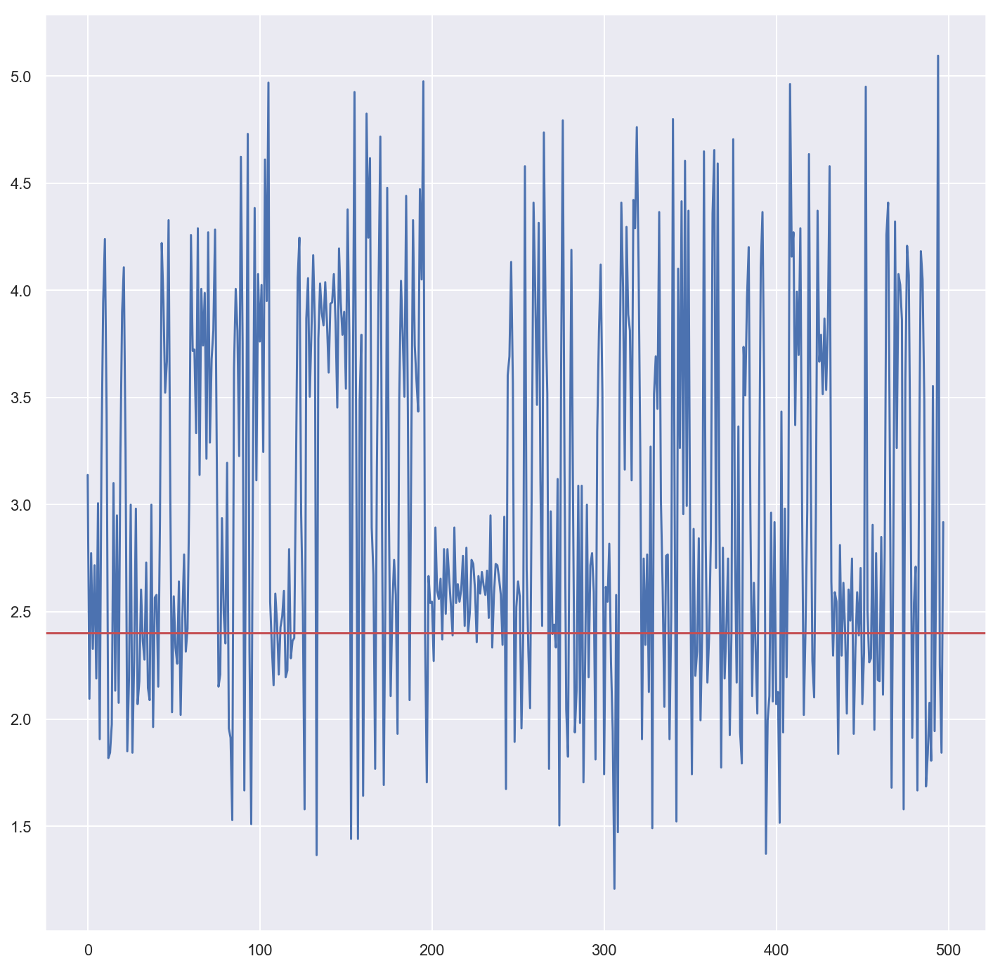

In [219]:
test(a=1, b=2)

Final angle 3.060681970476065


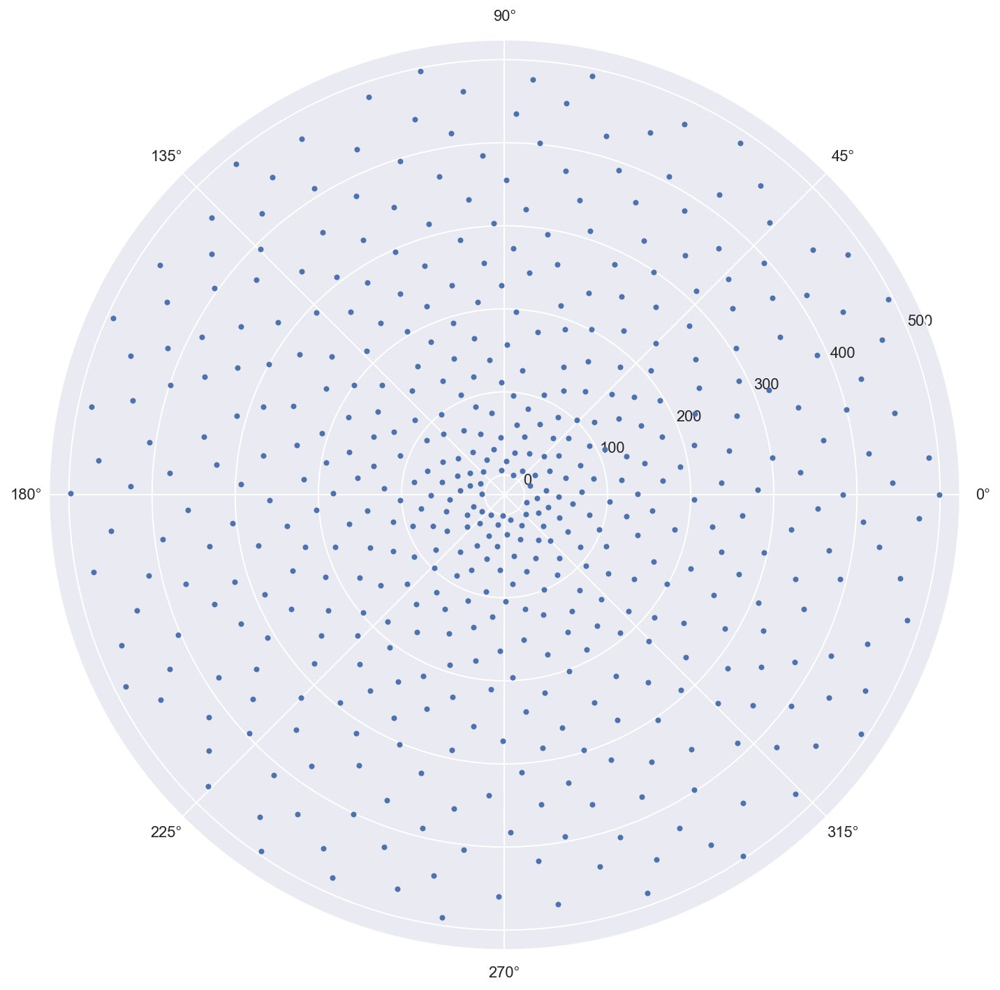

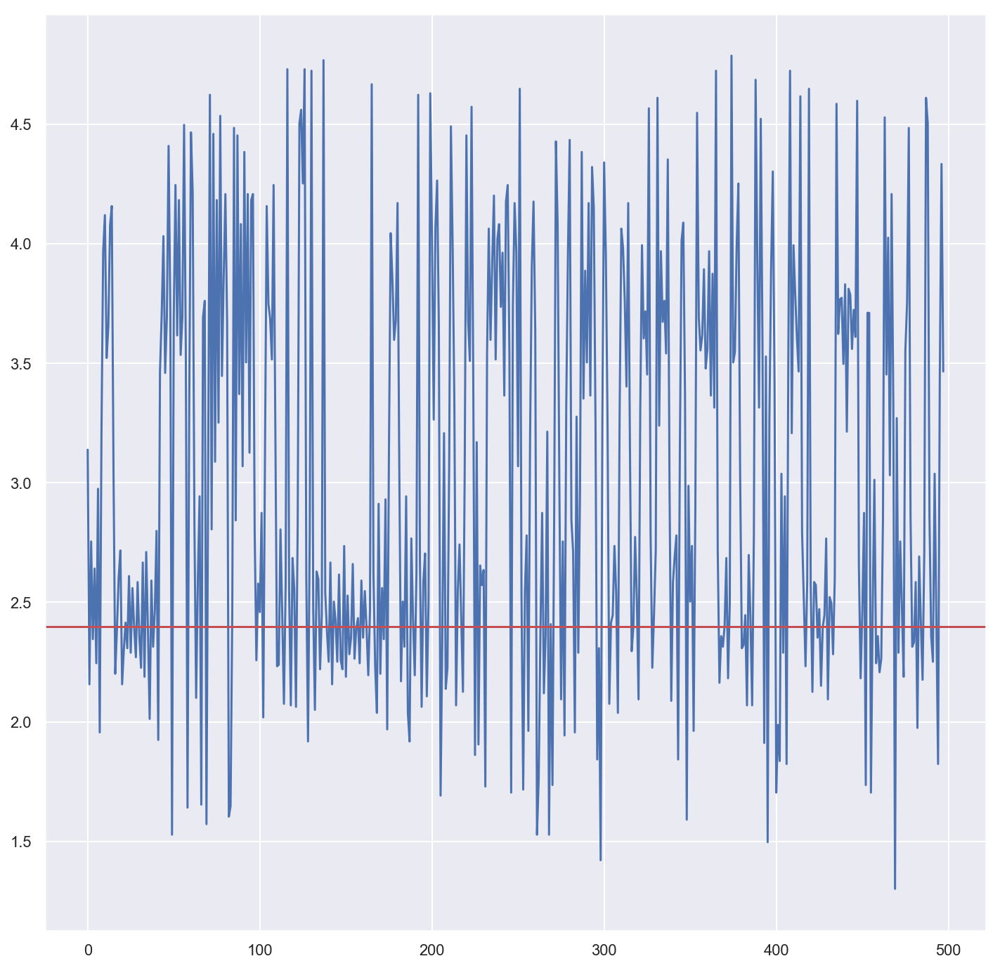

In [220]:
test(a=2, b=2)

Final angle 2.400116620559748


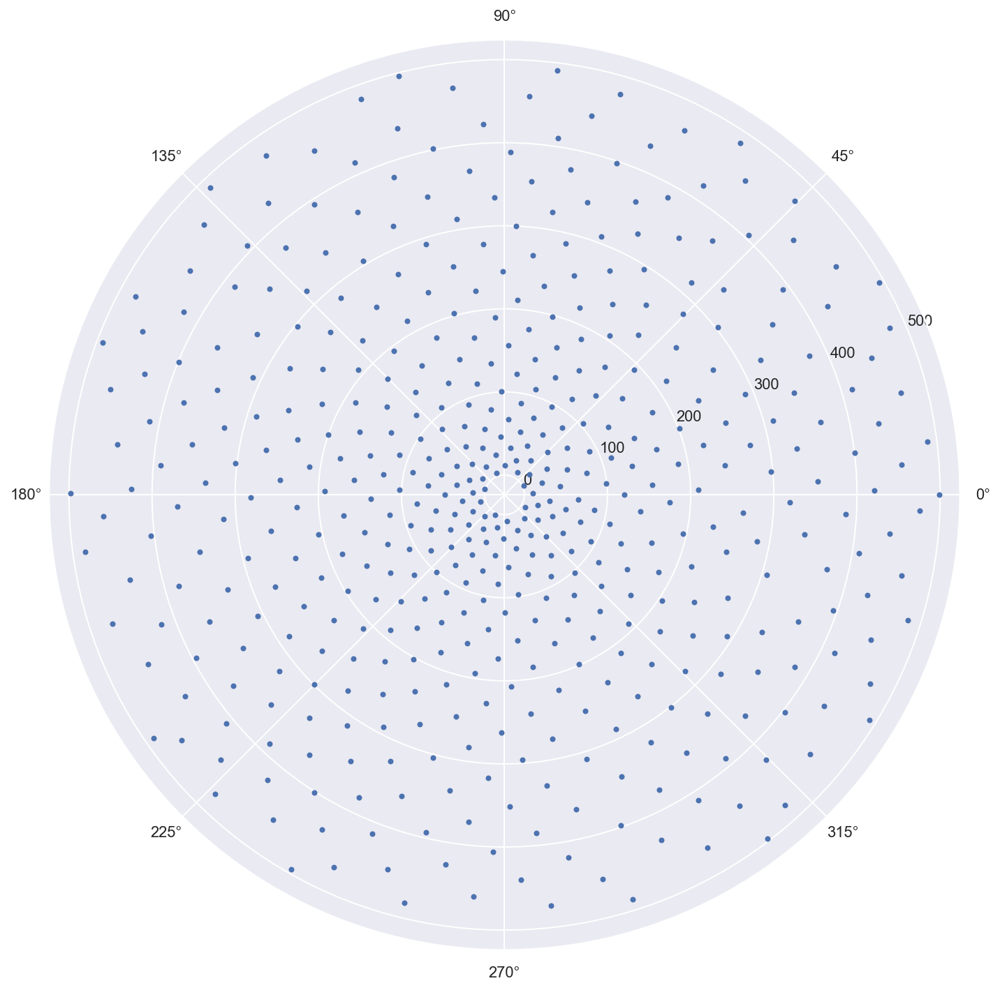

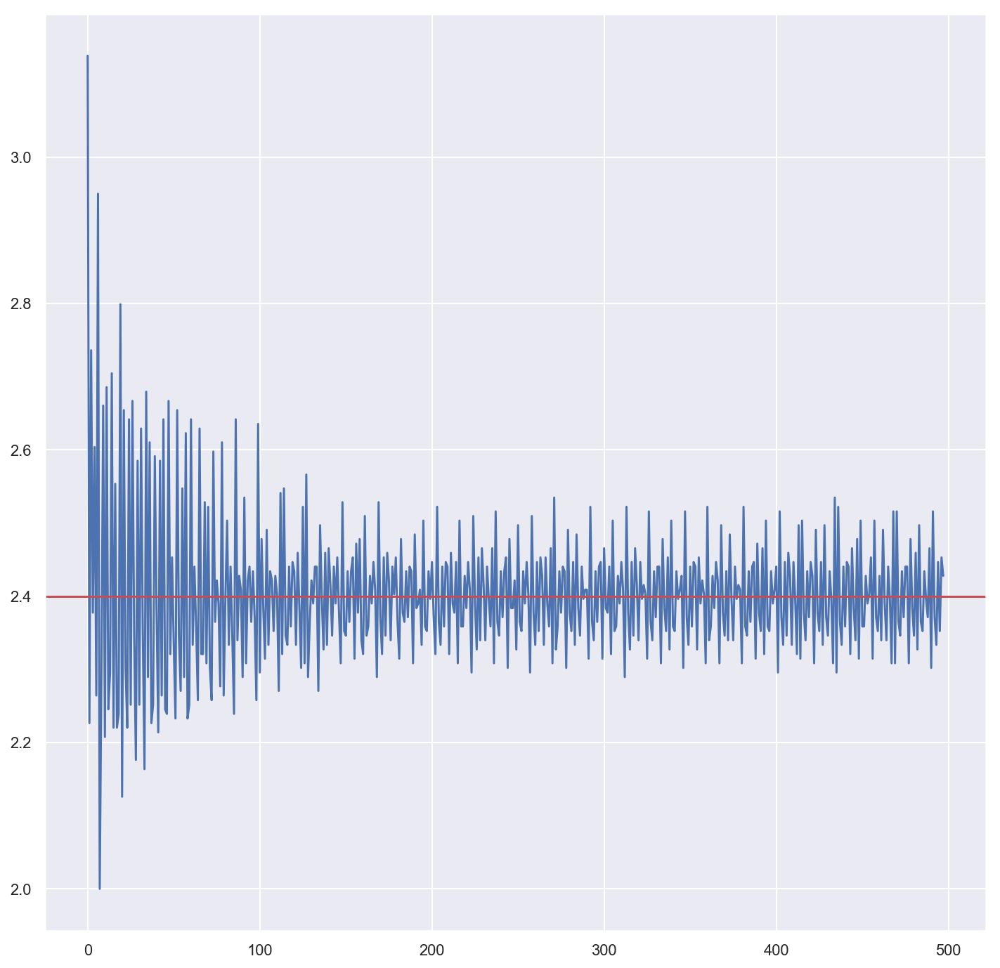

In [221]:
test(a=3, b=2)

Final angle 2.63924927168234


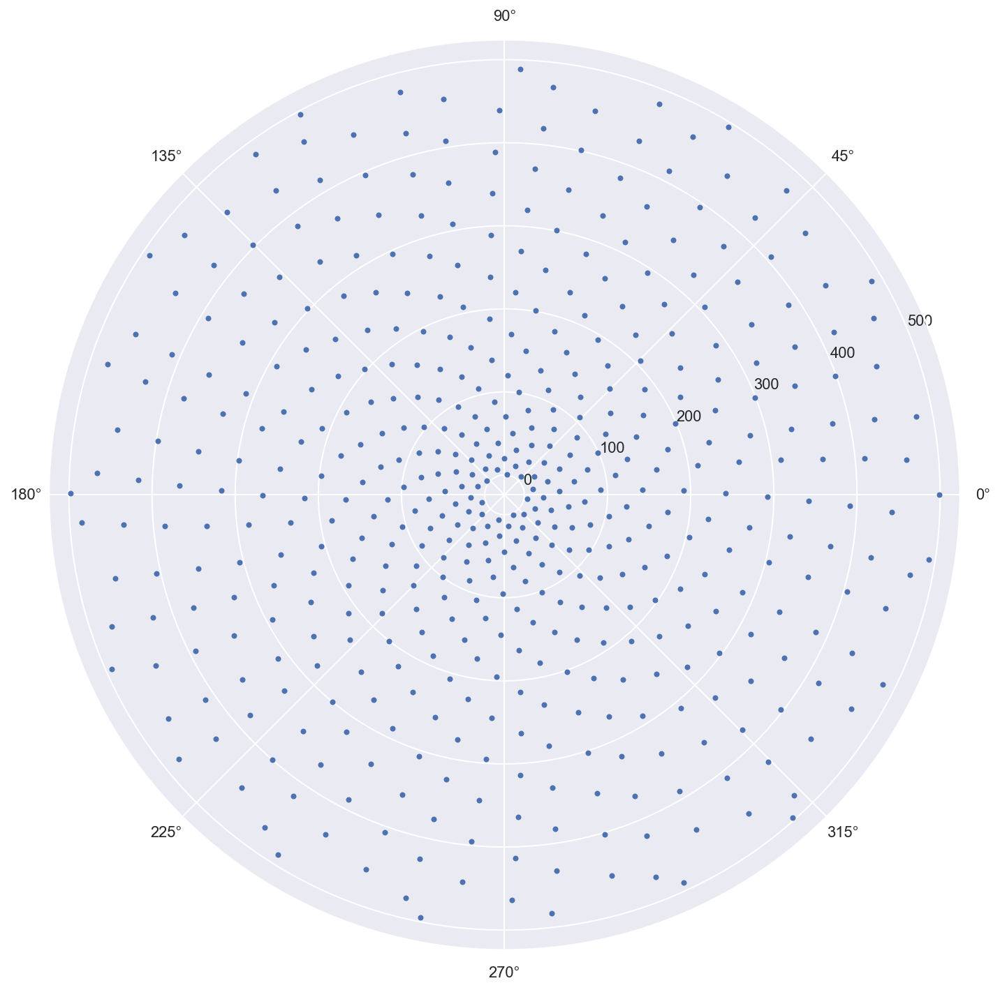

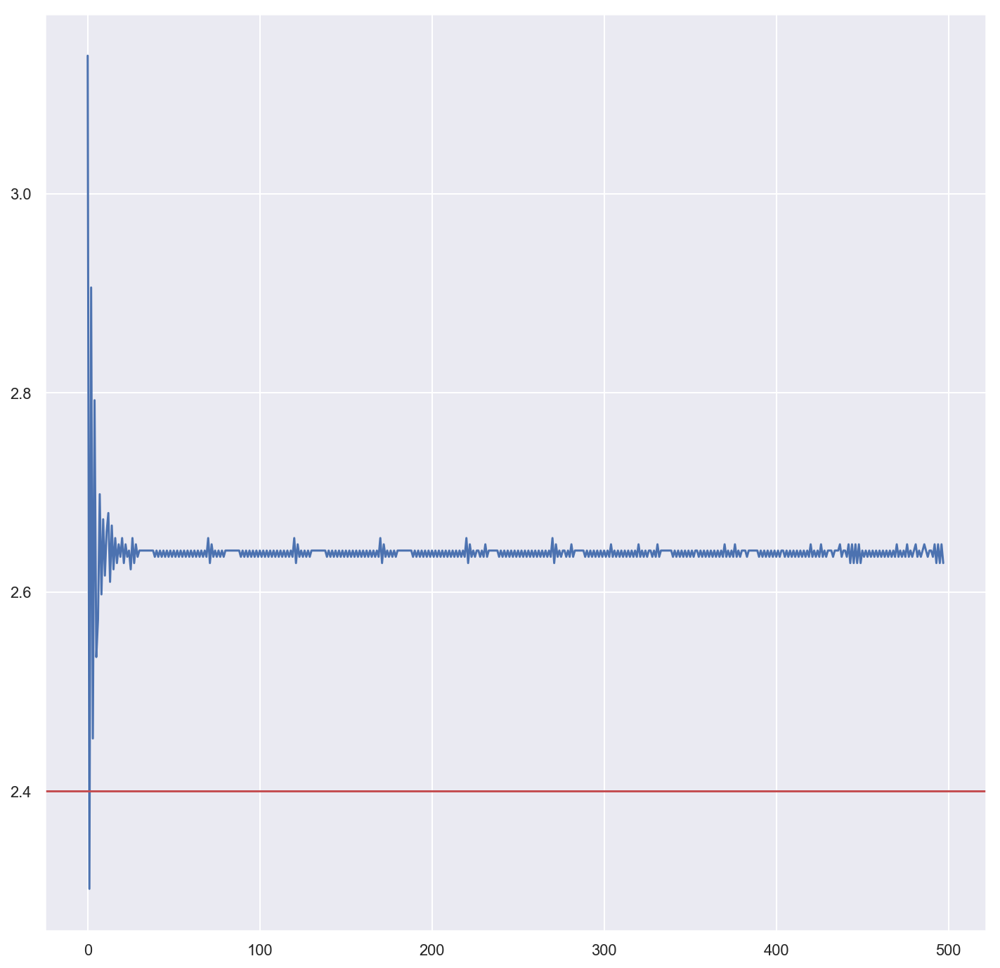

In [222]:
test(a=1, b=3)

Final angle 2.6405943099640248


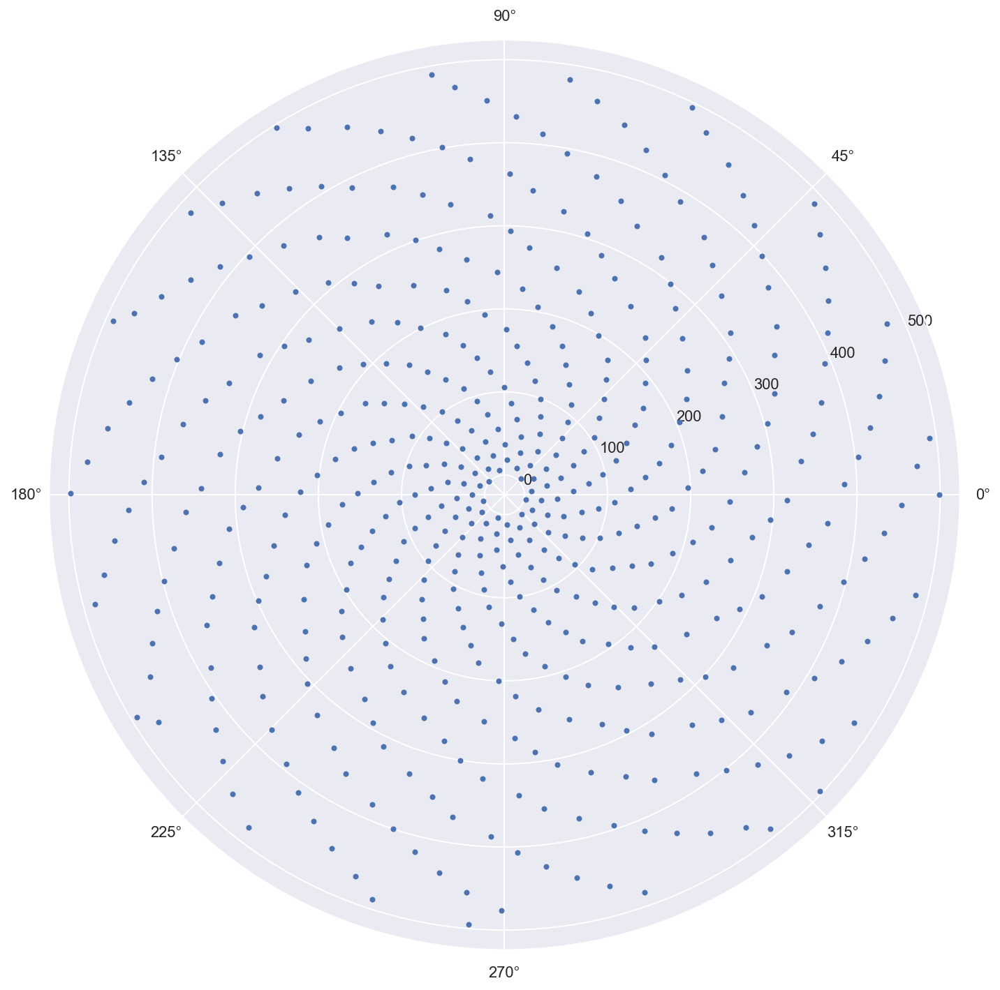

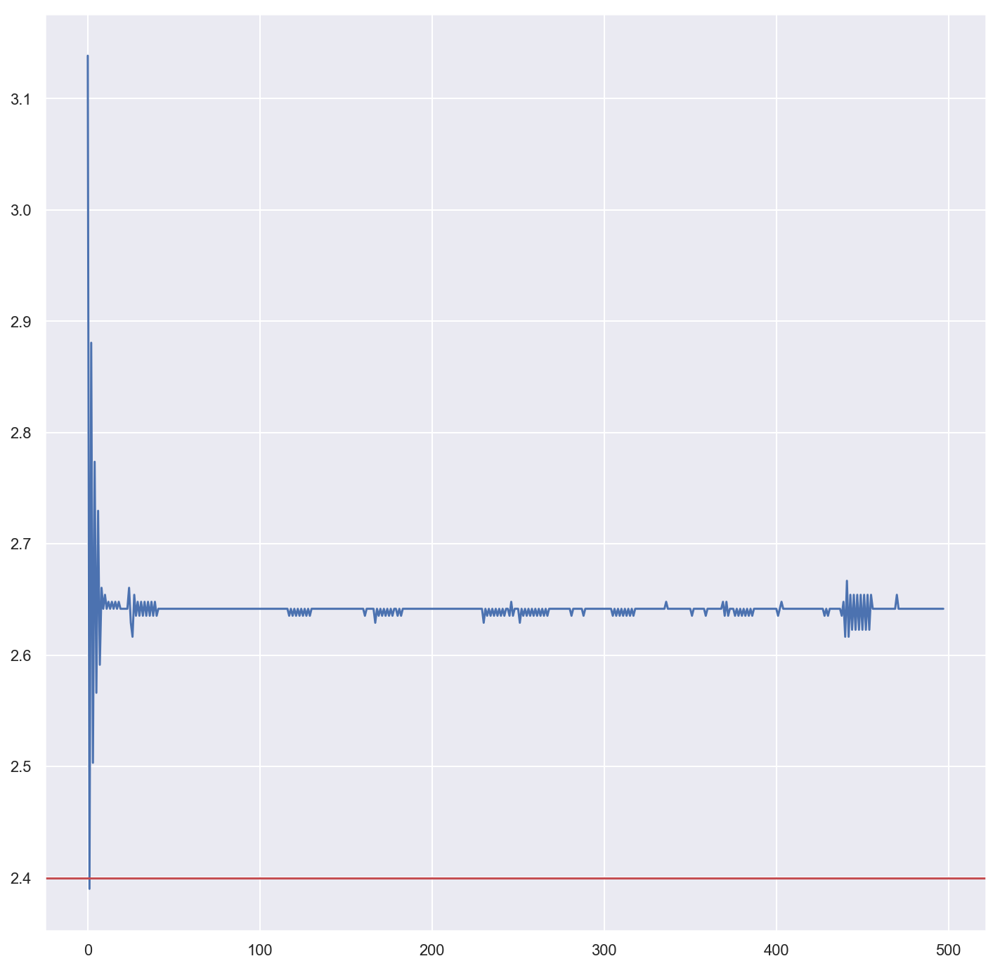

In [223]:
test(a=3, b=3)

Final angle 2.399965066950544


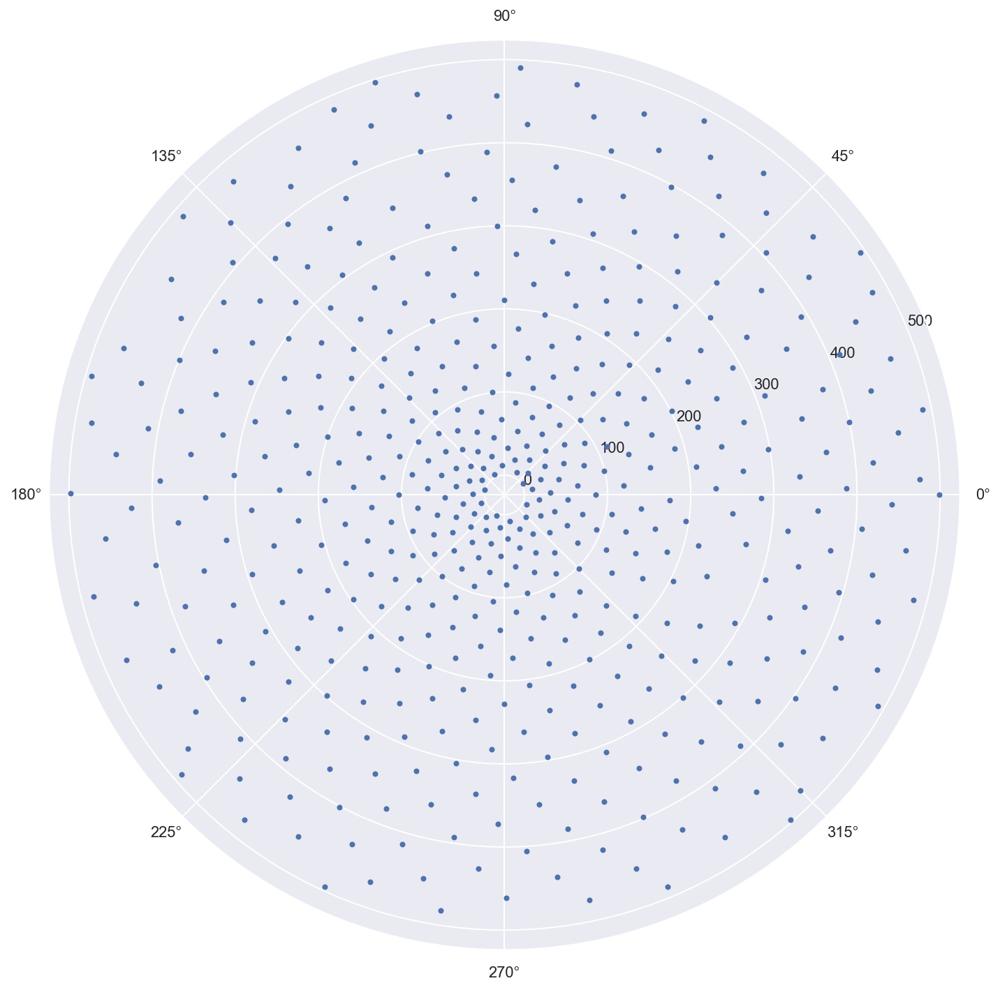

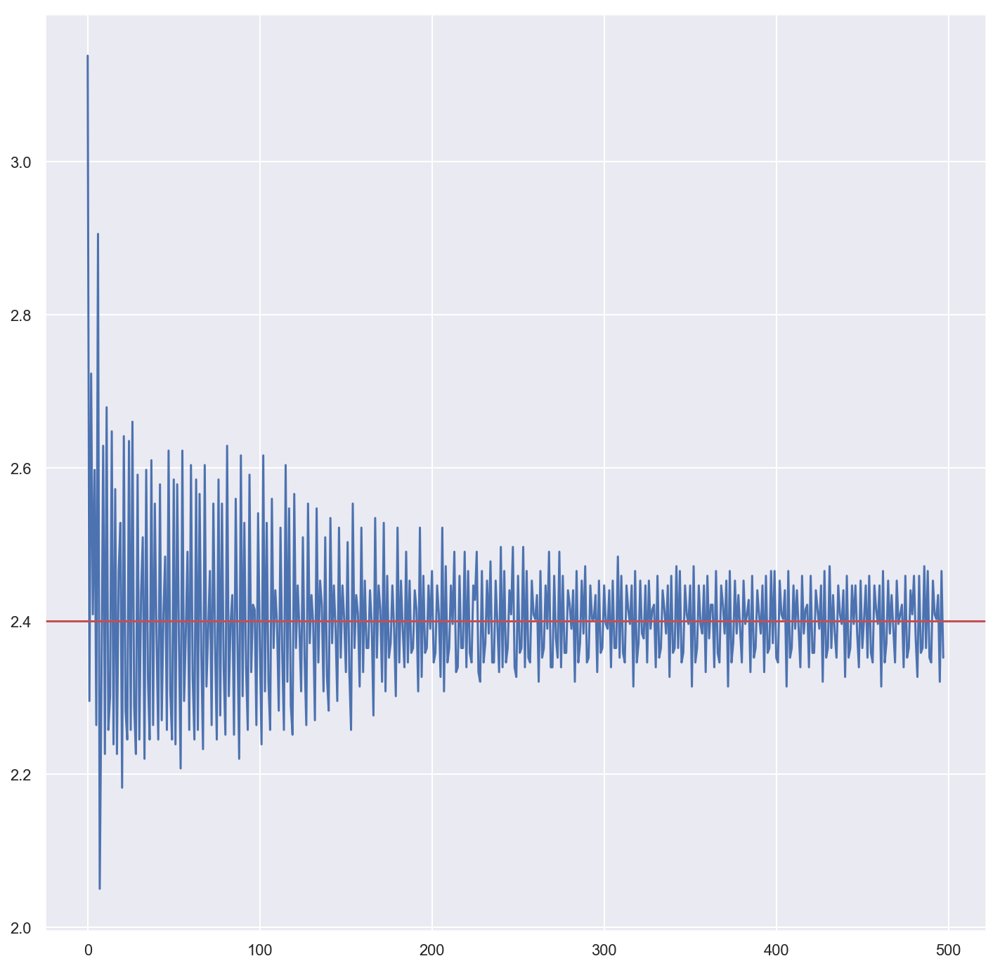

In [224]:
test(a=4, b=2)

Final angle 2.7648872137123672


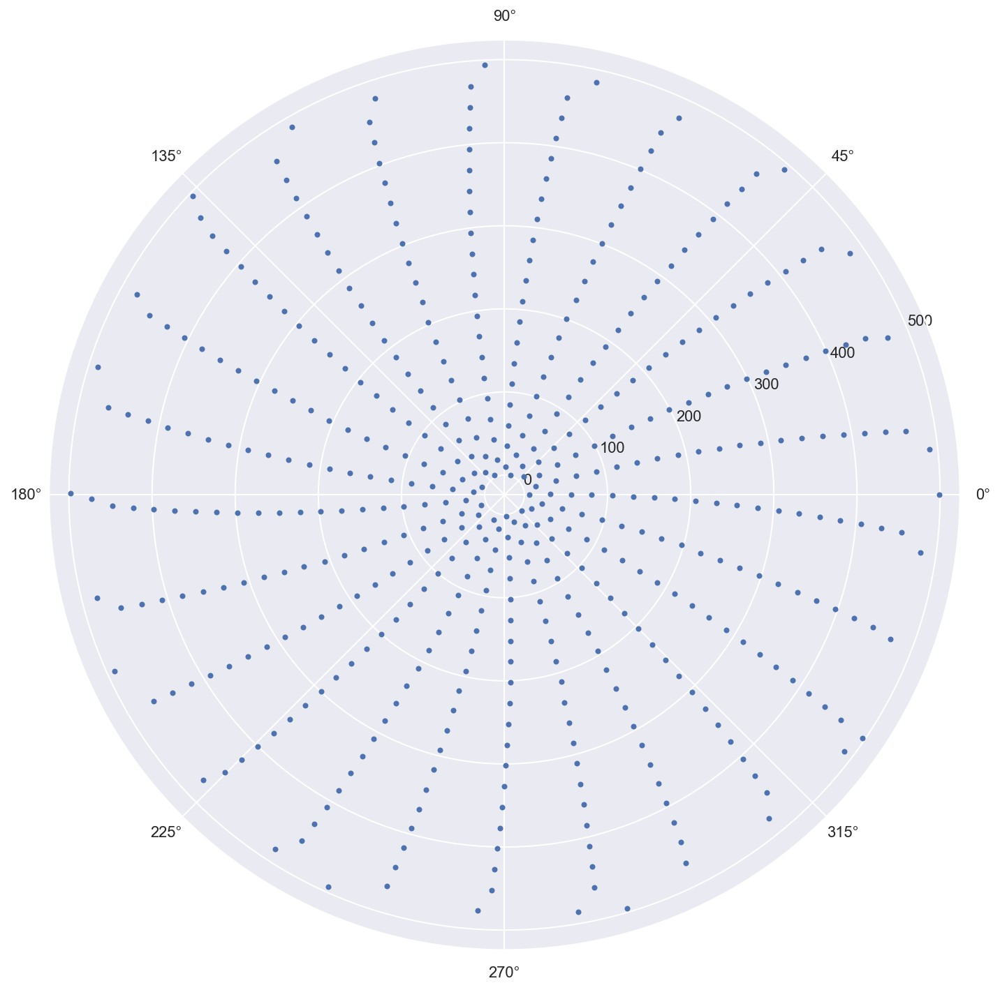

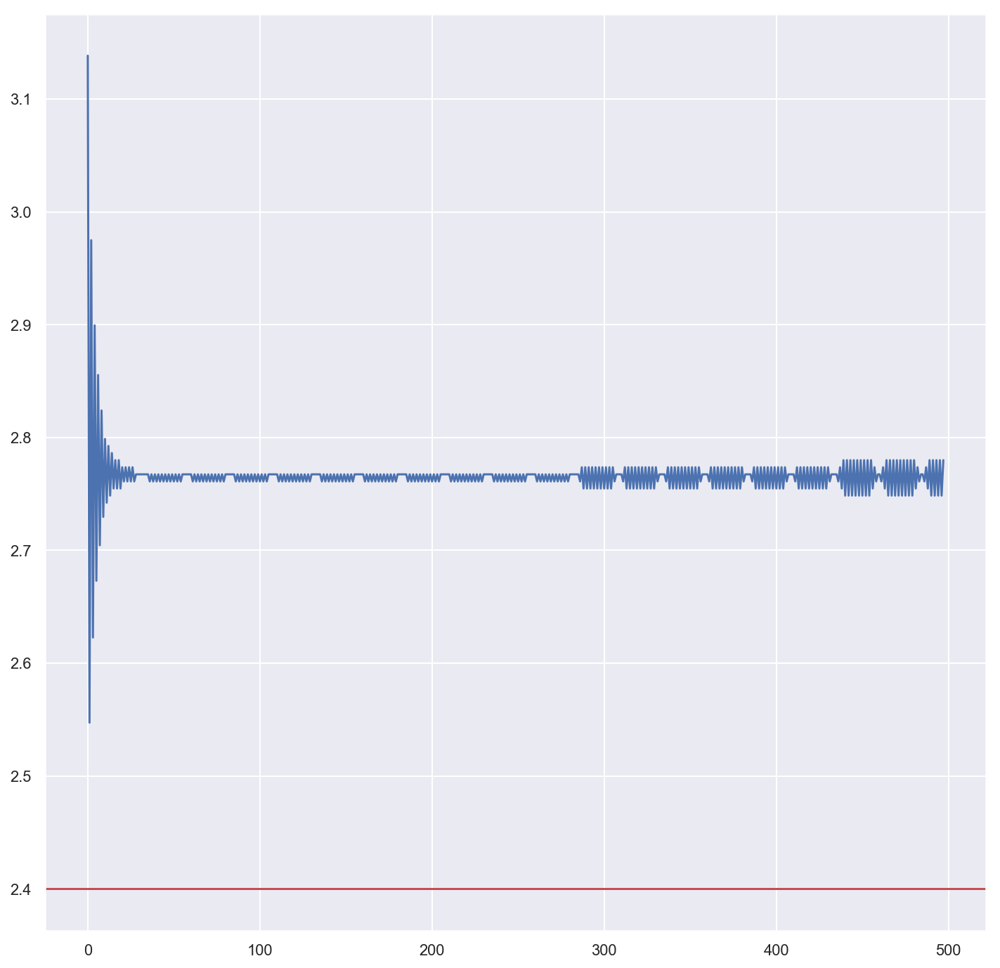

In [225]:
test(a=3, b=4)

Final angle 2.46520889571282


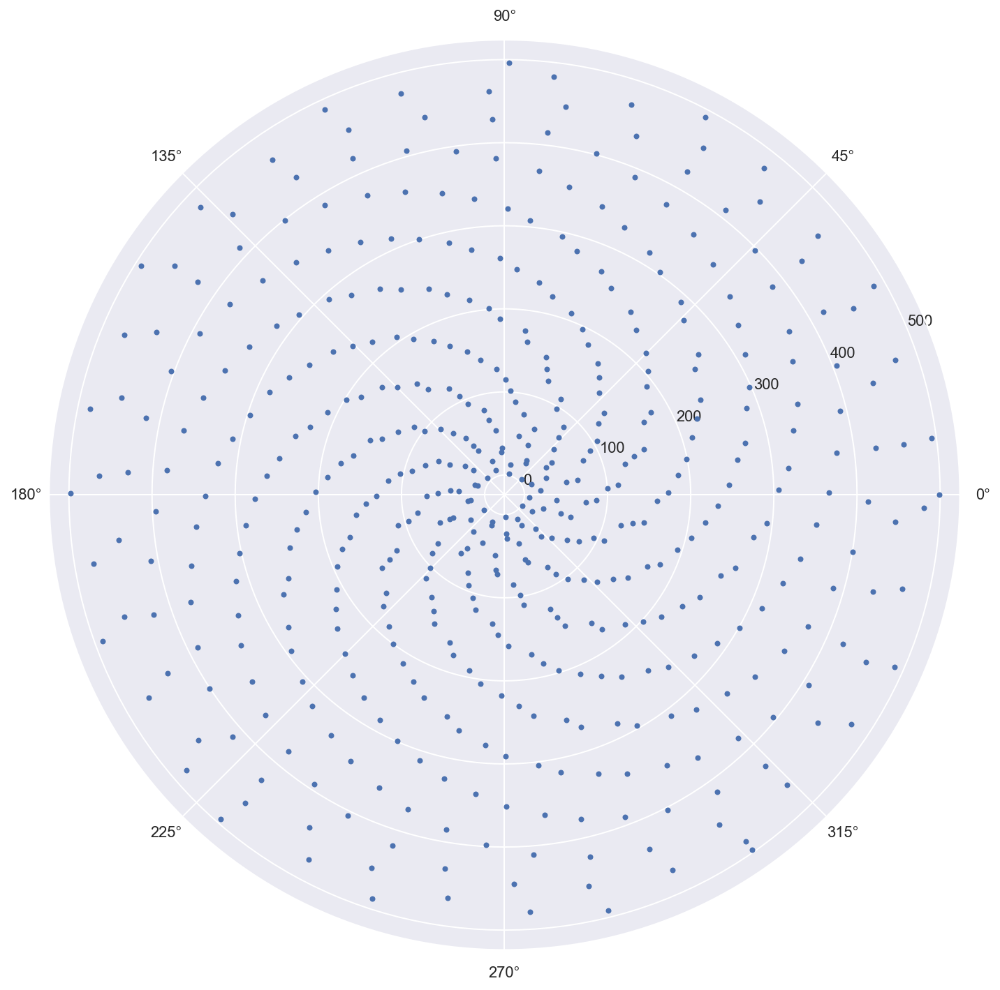

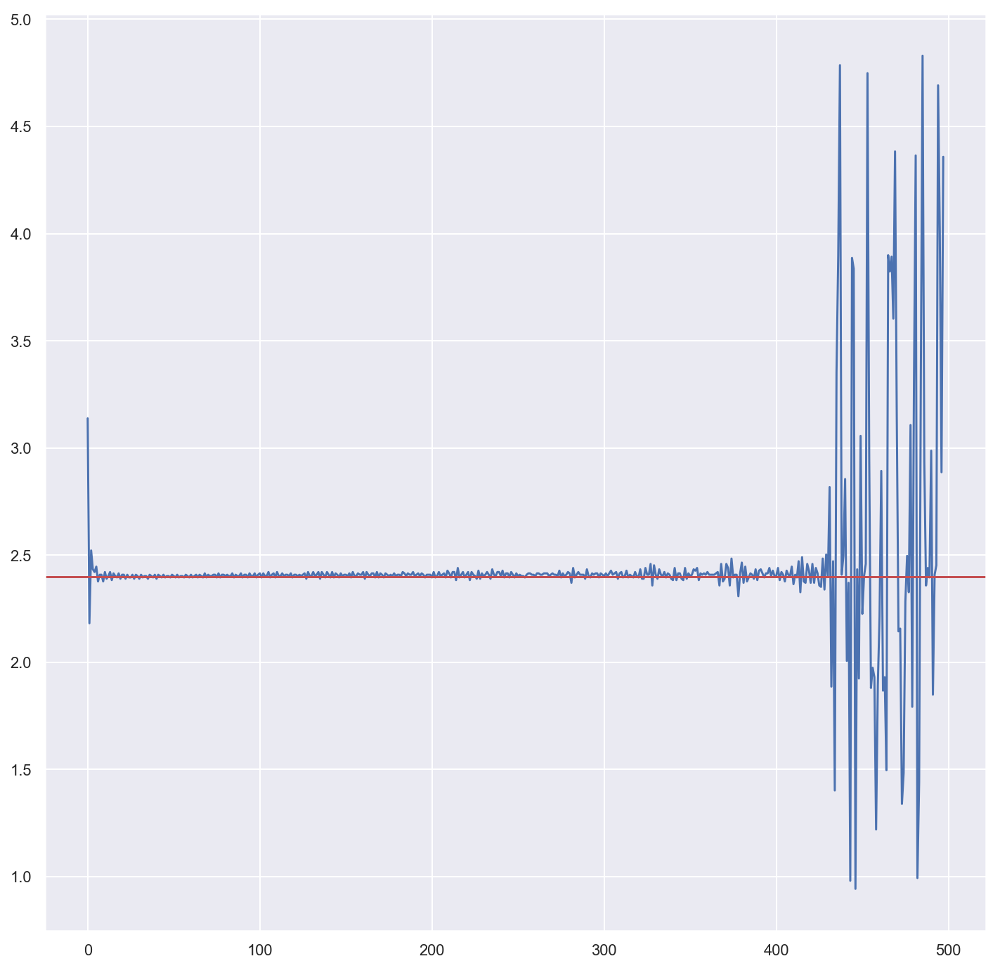

In [226]:
test(a=4, b=1)

Final angle 2.46520889571282


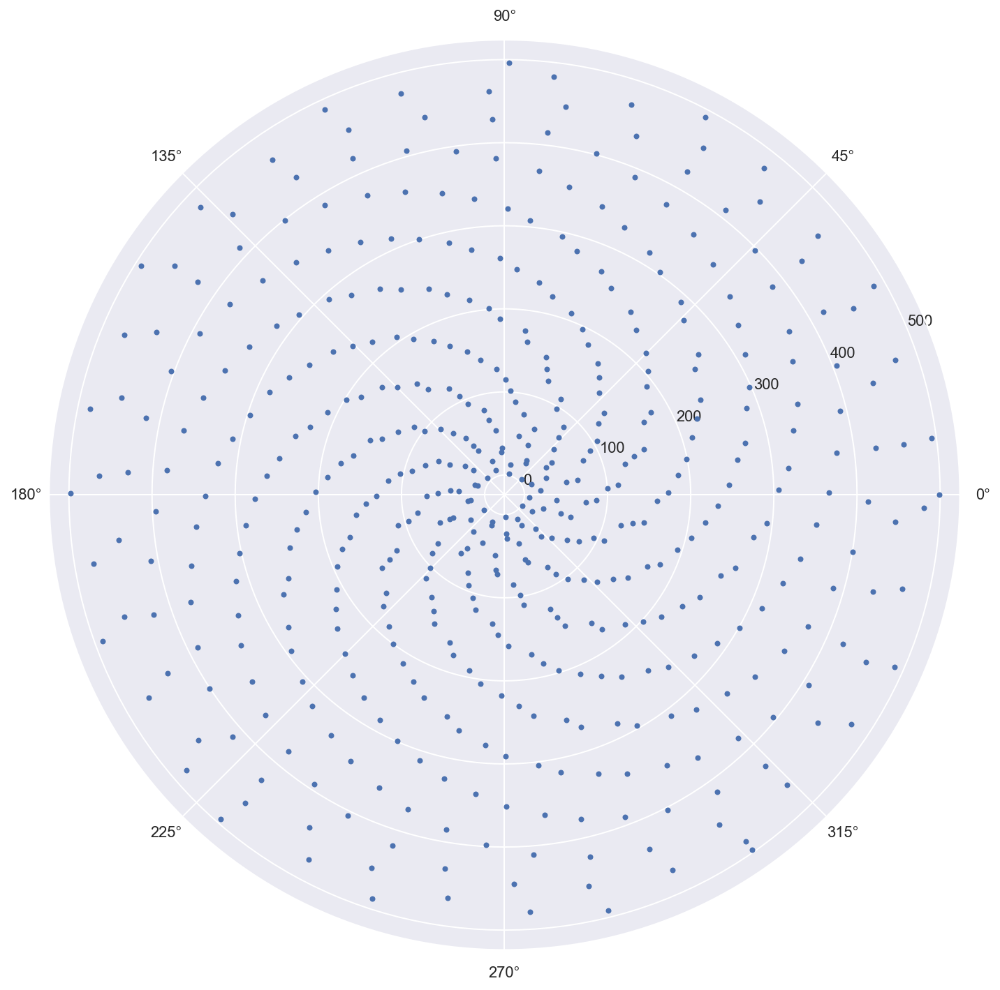

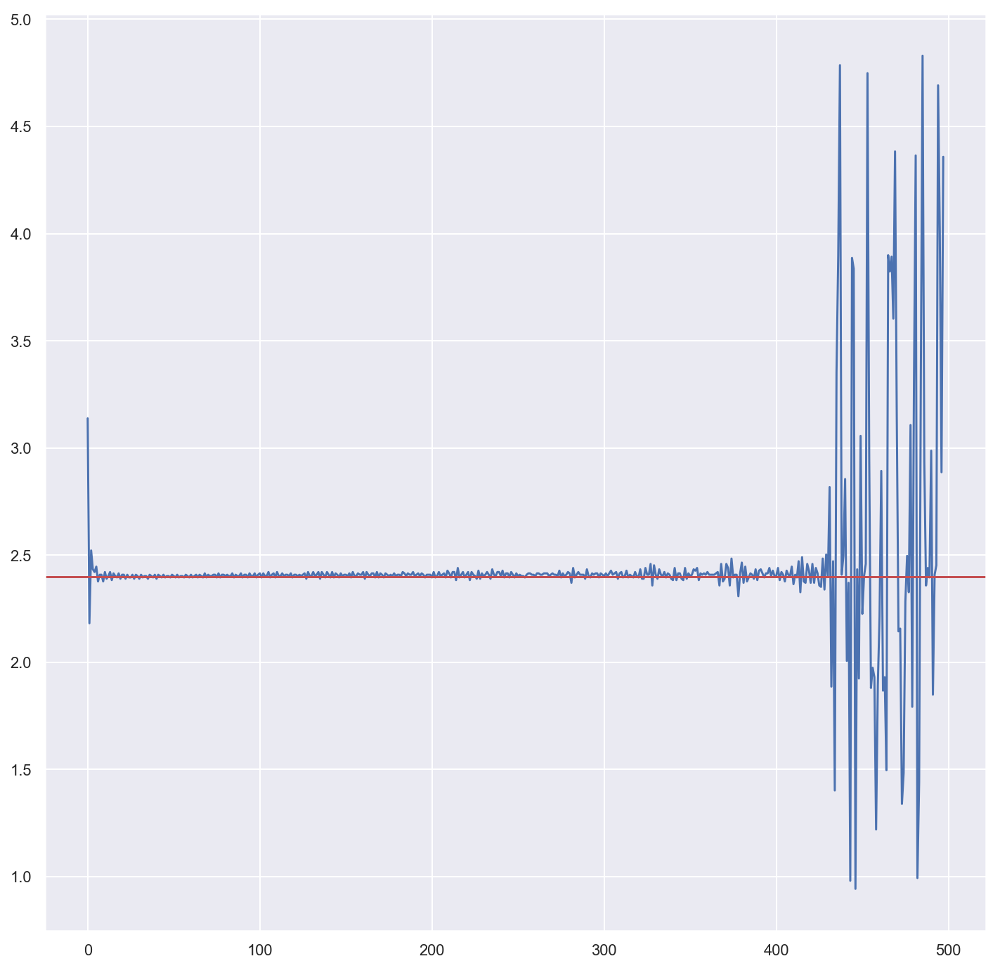

In [227]:
test(a=4, b=1)

Final angle 2.4635986386150286


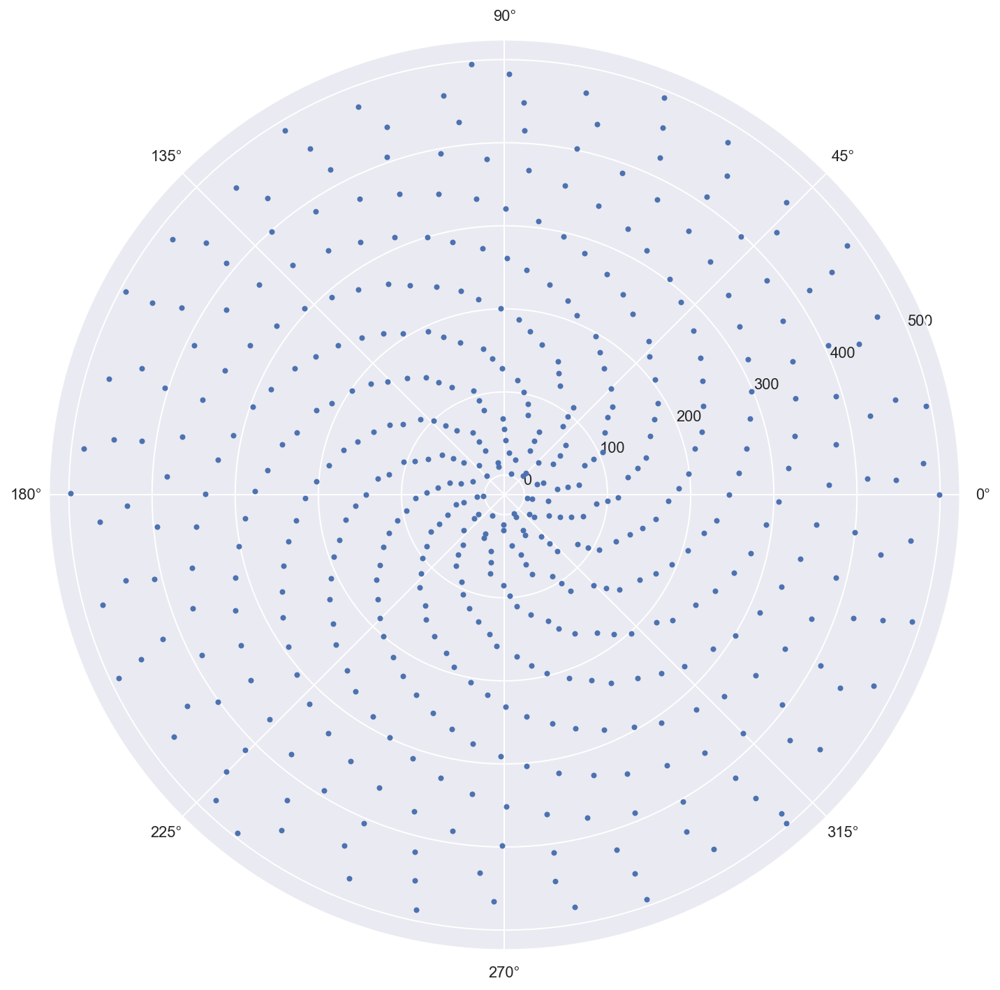

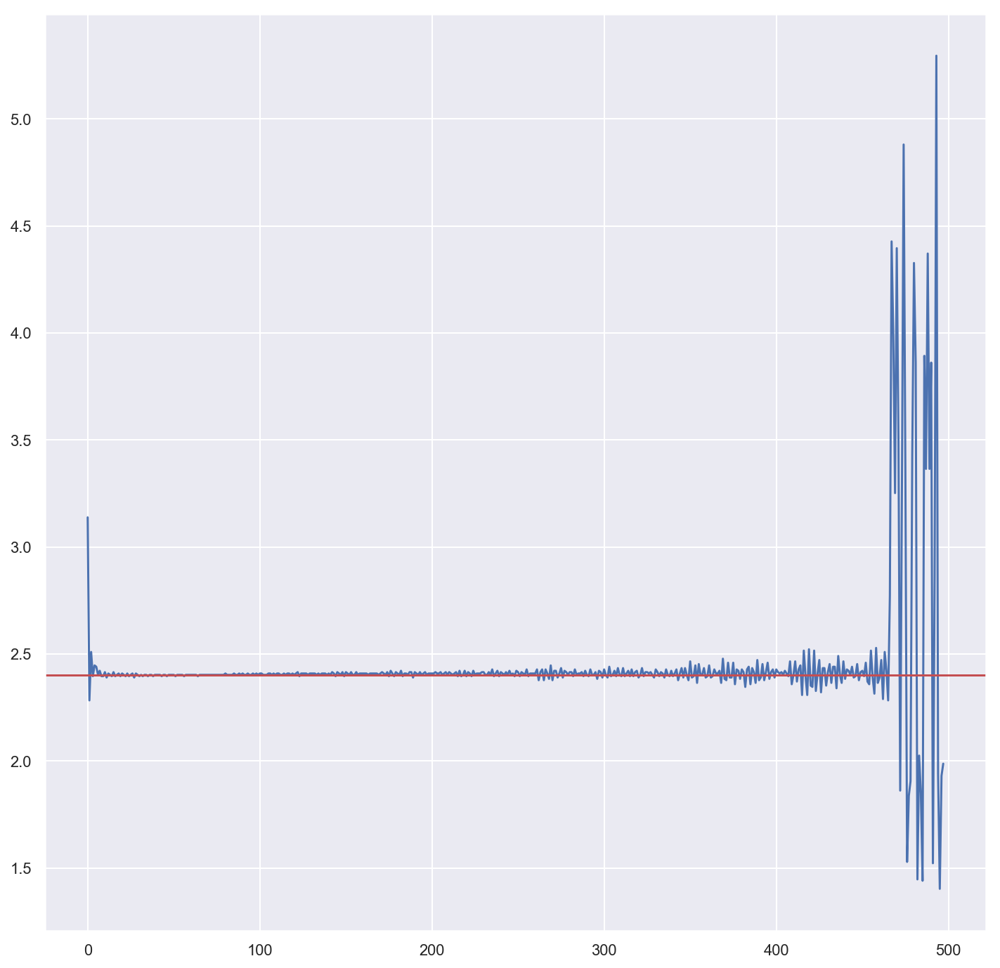

In [228]:
test(a=5, b=1)

Final angle 2.4194965383366958


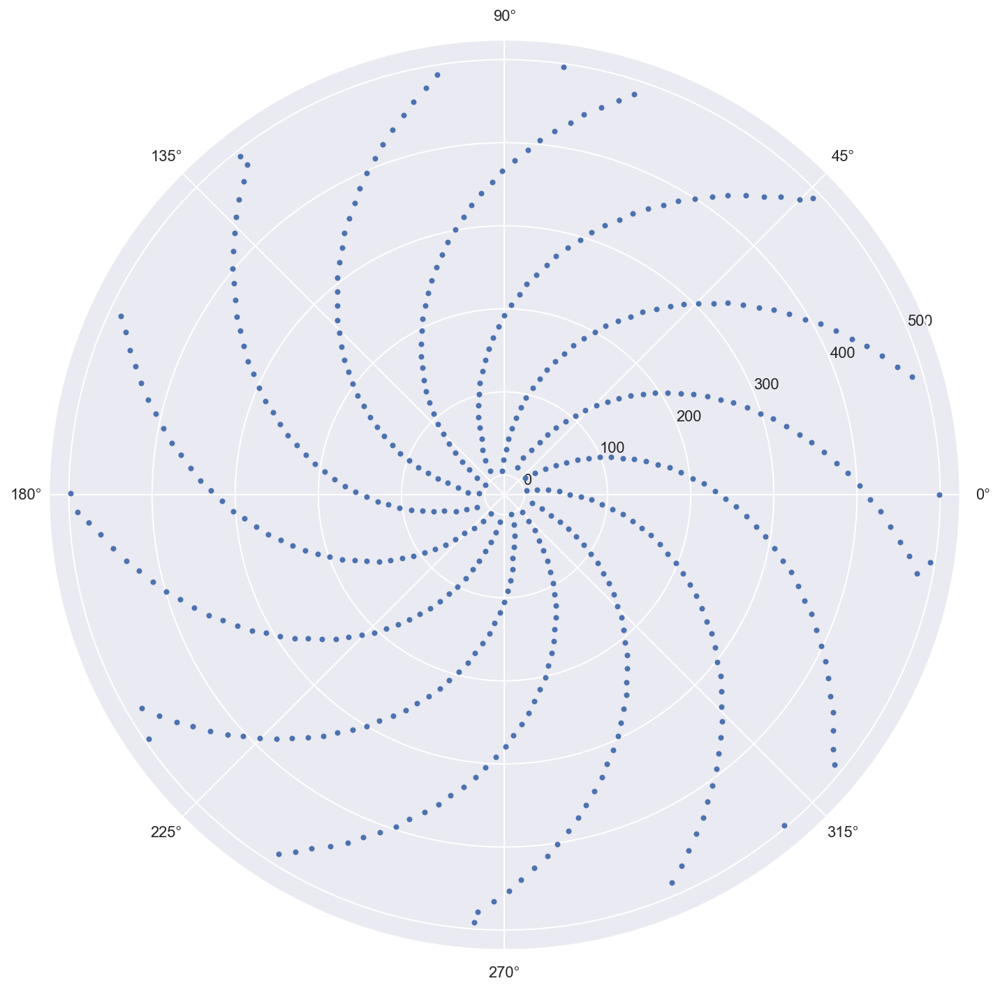

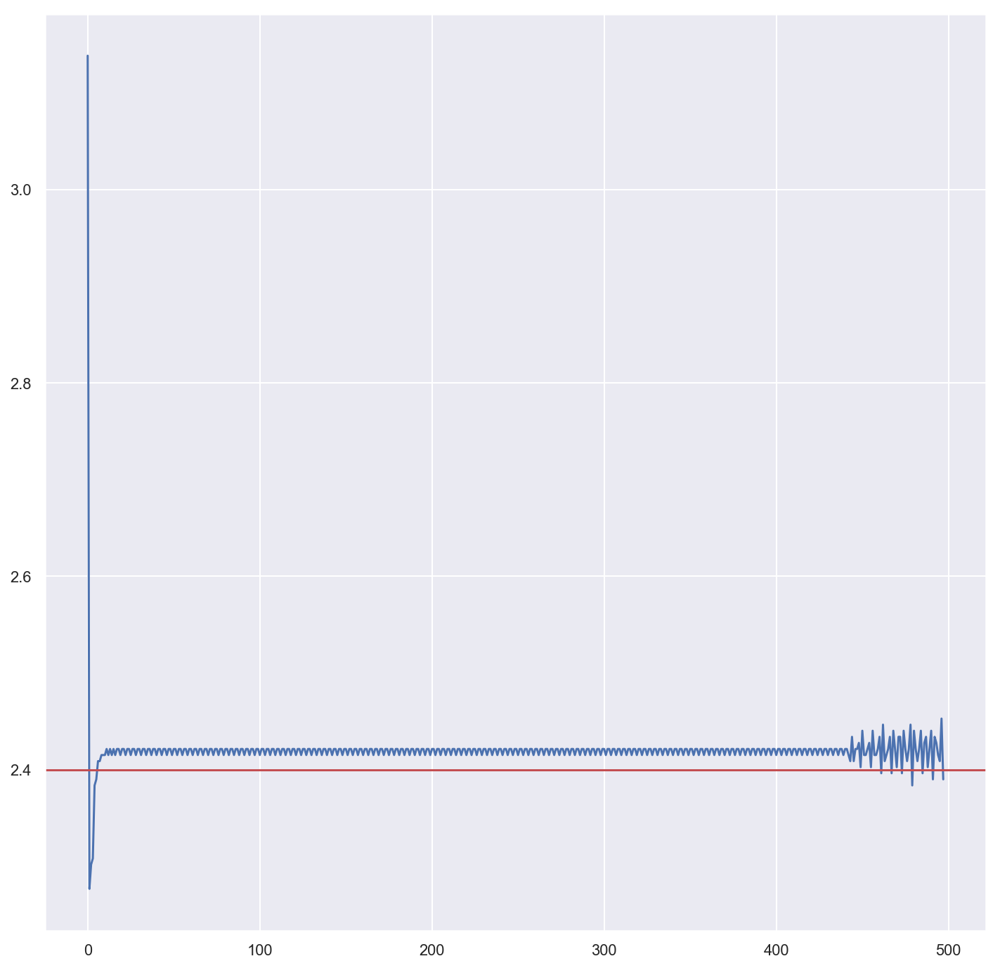

In [229]:
test(a=5, b=0)

Final angle 2.4206669864513417


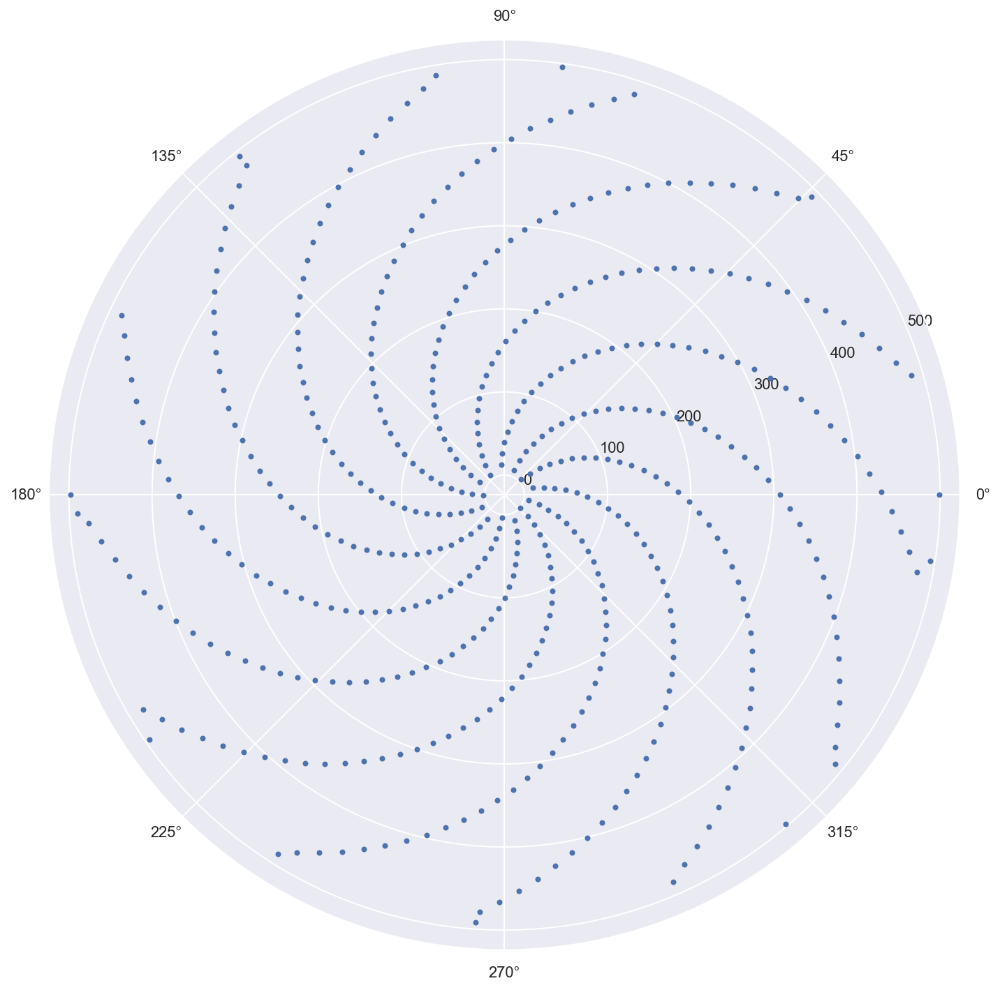

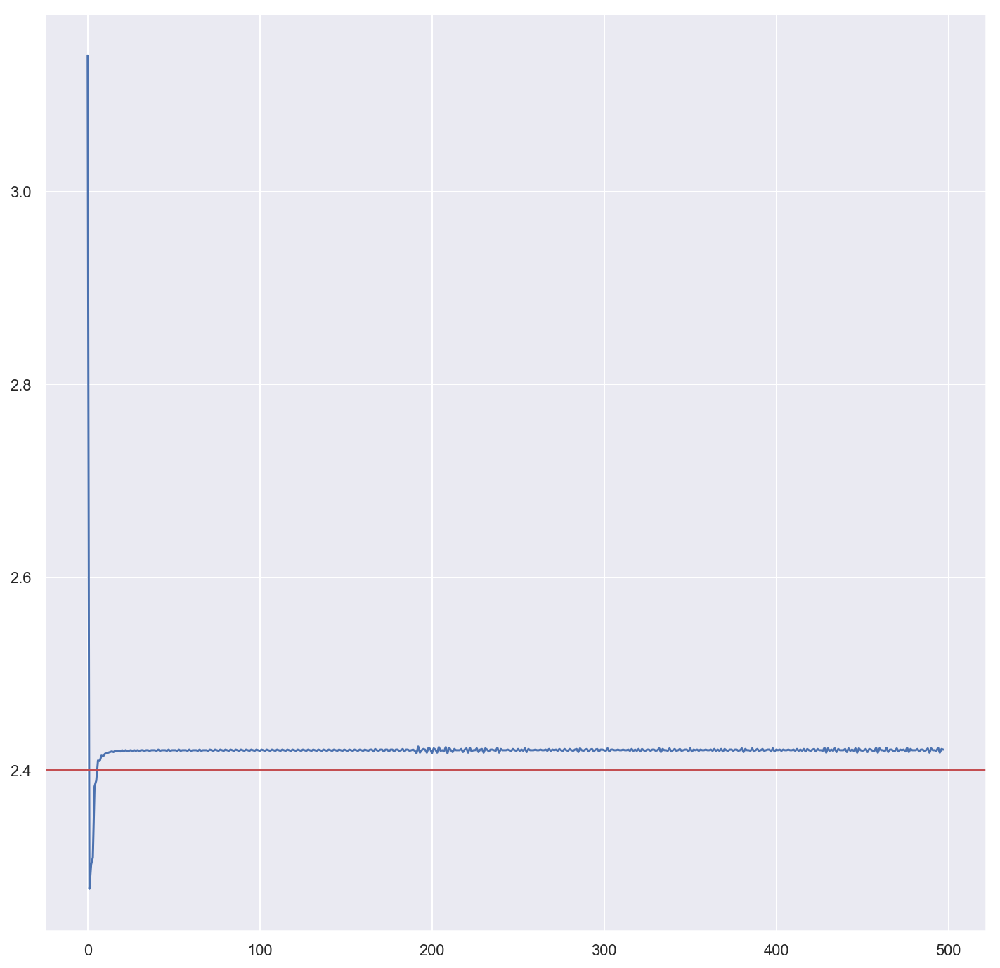

In [6]:
test(a=5, b=0, M=10000)

Final angle 2.4189010833876625


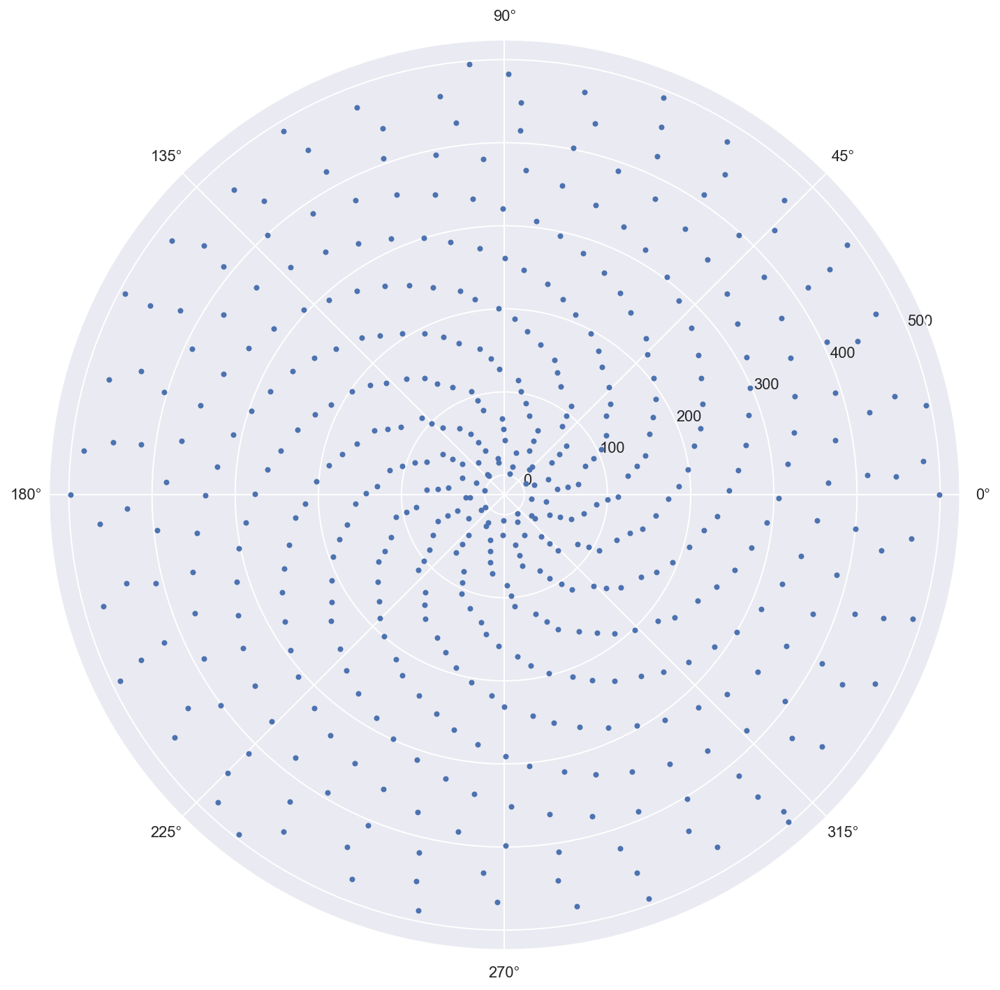

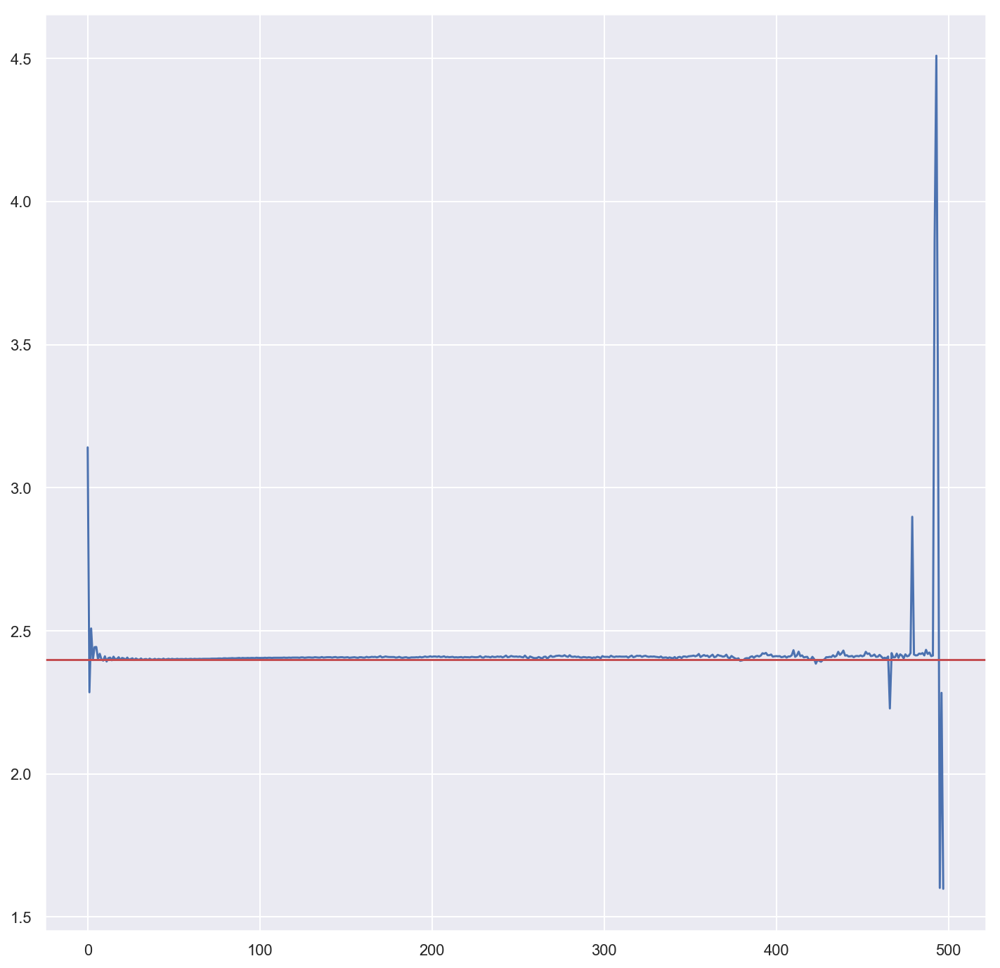

In [7]:
test(a=5, b=1, M=10000)

Final angle 2.602649637758644


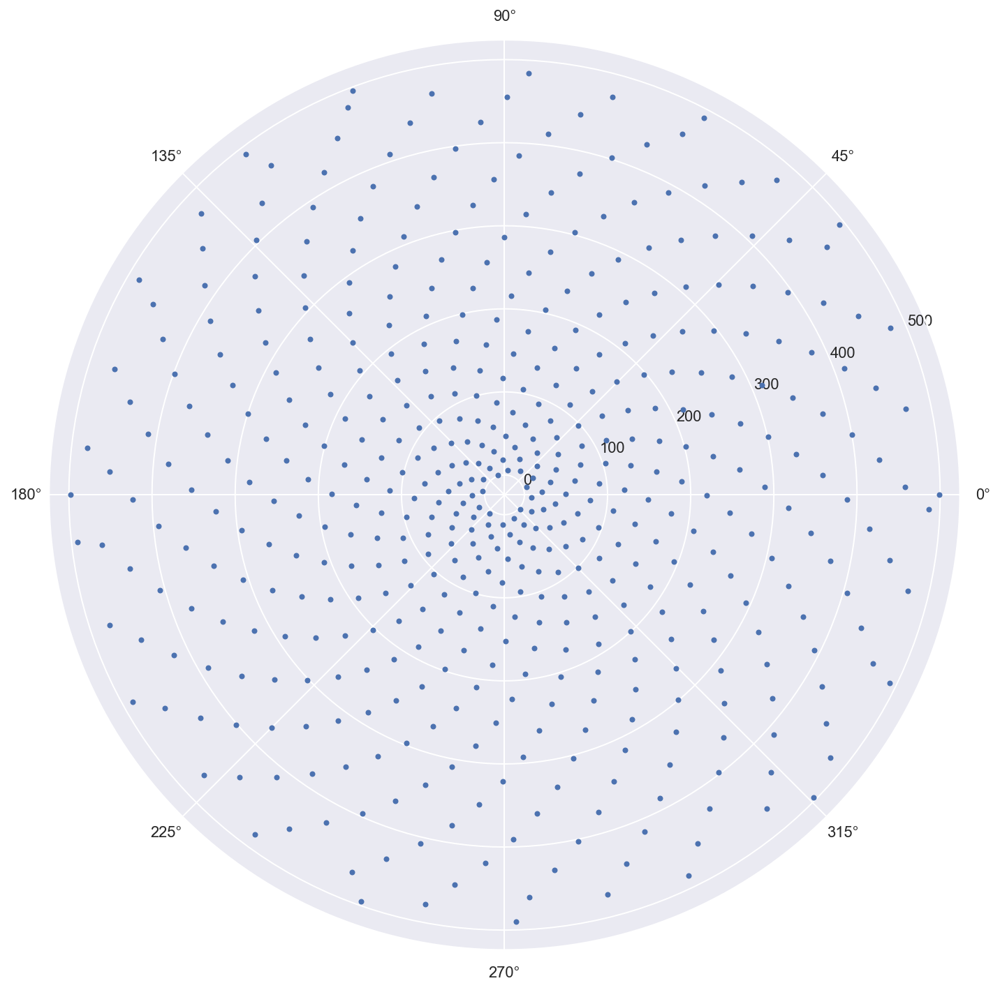

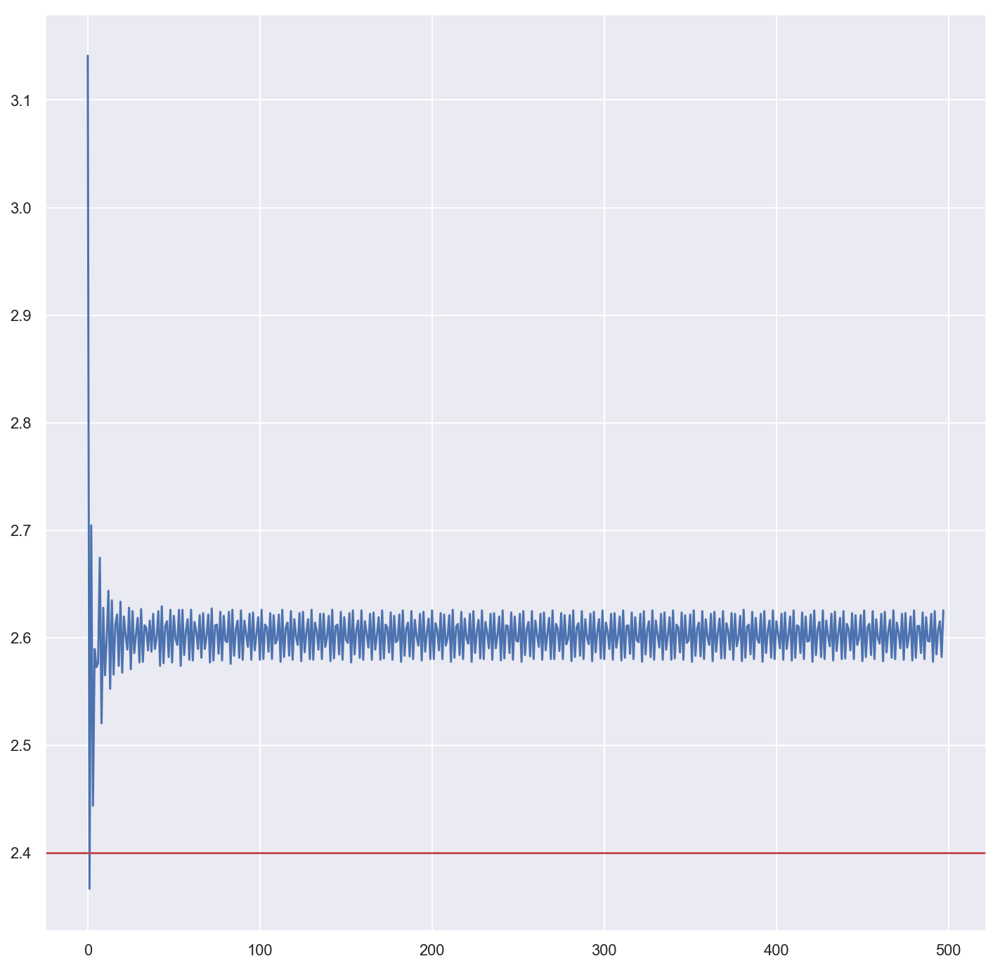

In [8]:
test(a=5, b=2, M=10000)

Final angle 2.647849939004661


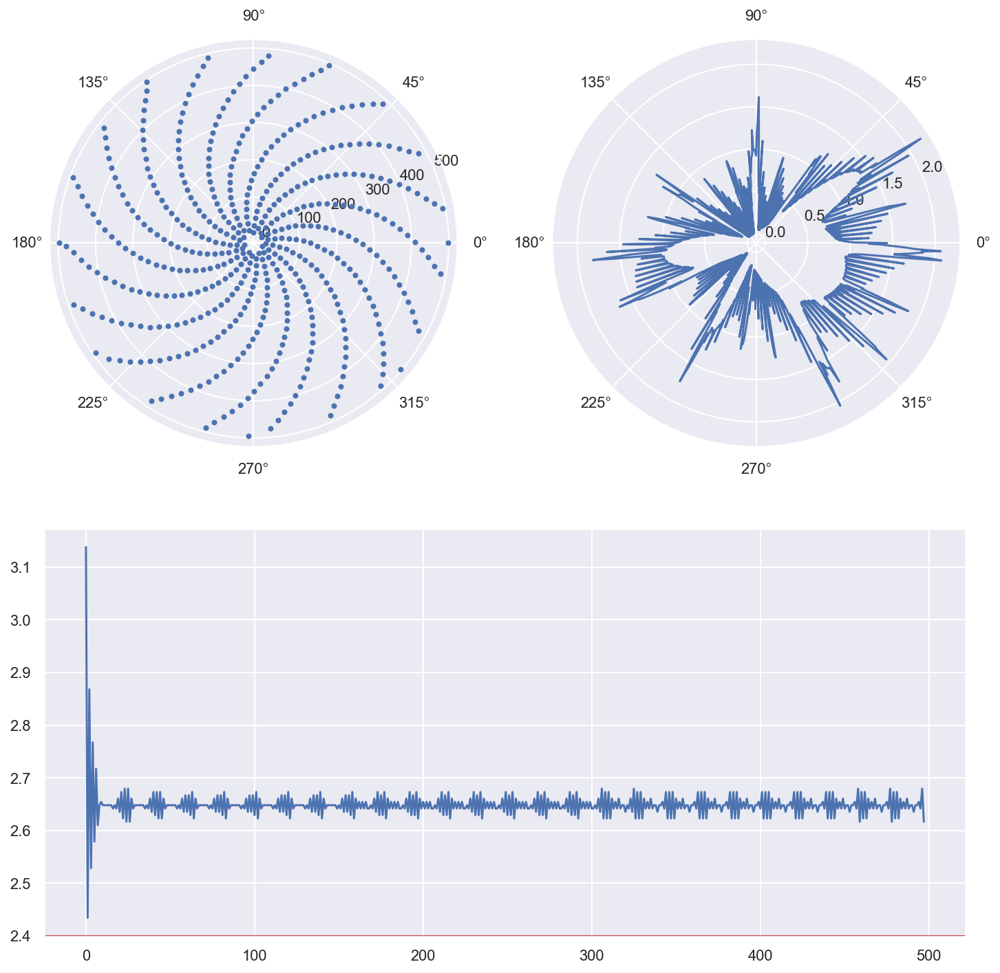

In [21]:
test(a=4, b=3, M=1000)

Final angle 2.63924927168234


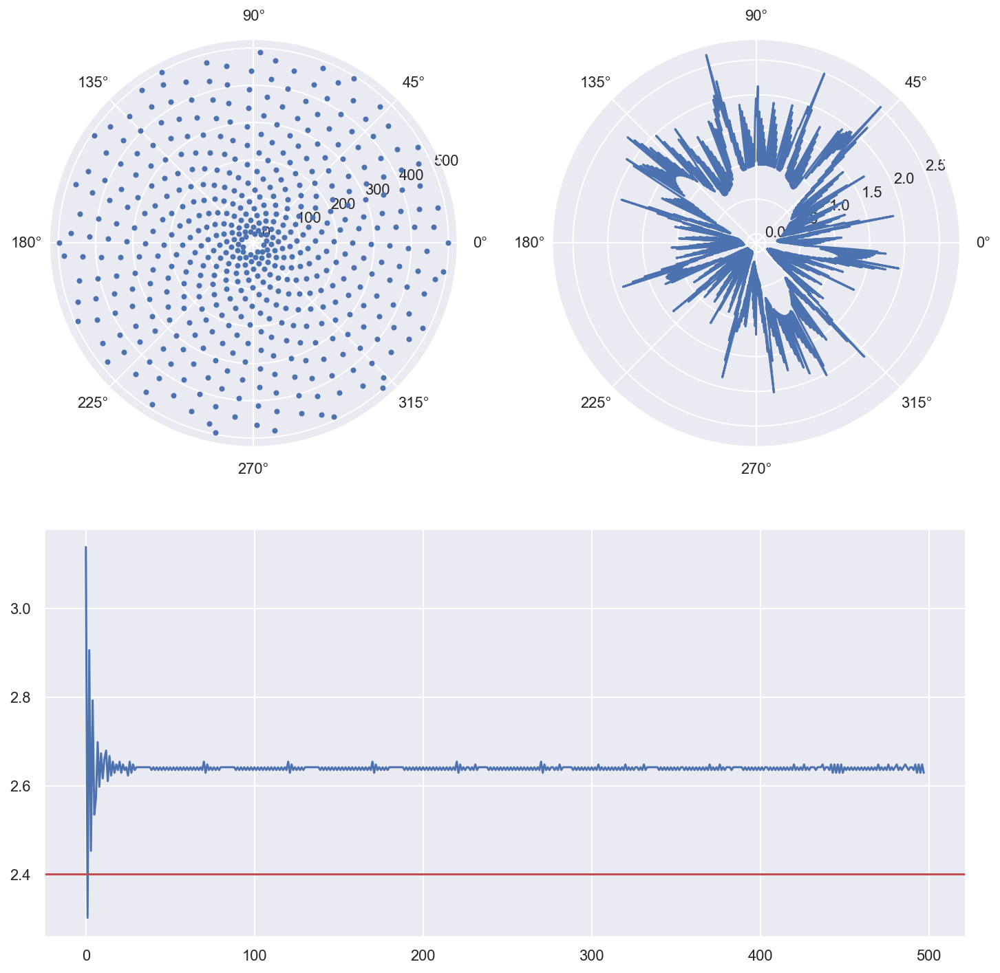

In [22]:
test(a=1, b=3, M=1000)

Final angle 2.640954249785884


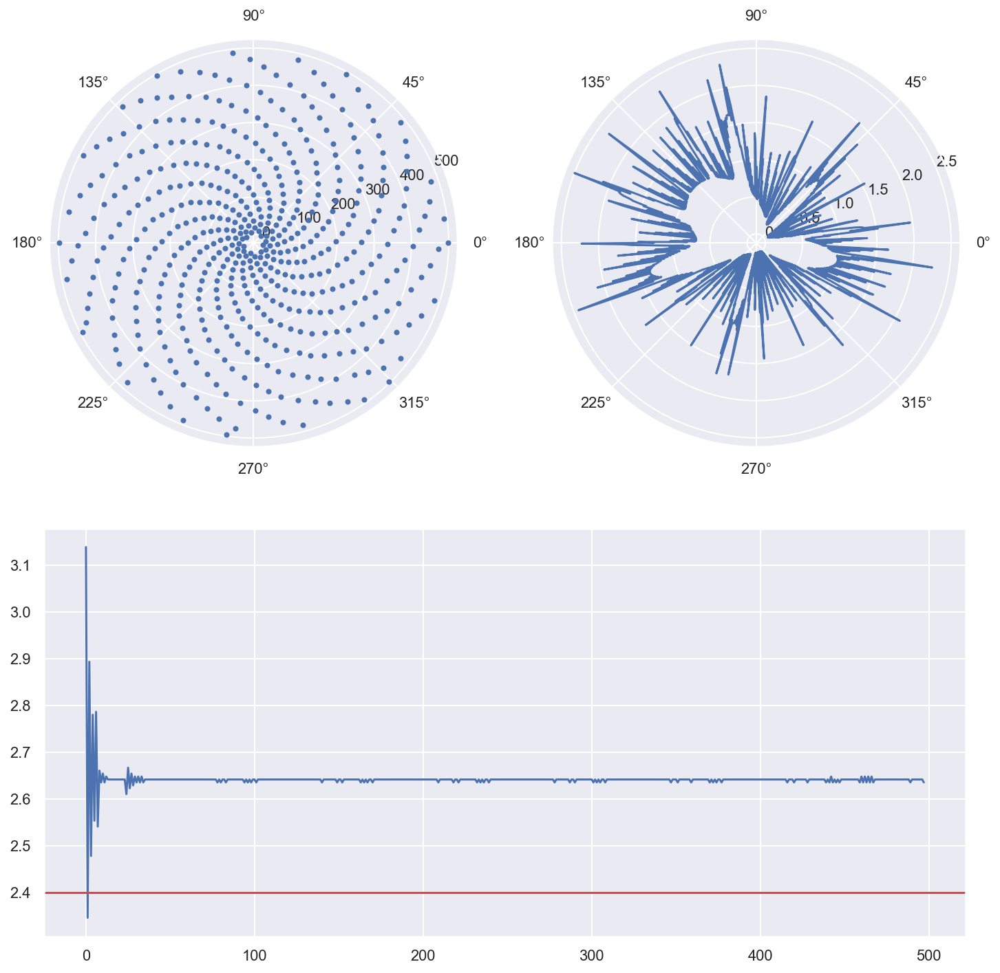

In [23]:
test(a=2, b=3, M=1000)

Final angle 2.6405943099640248


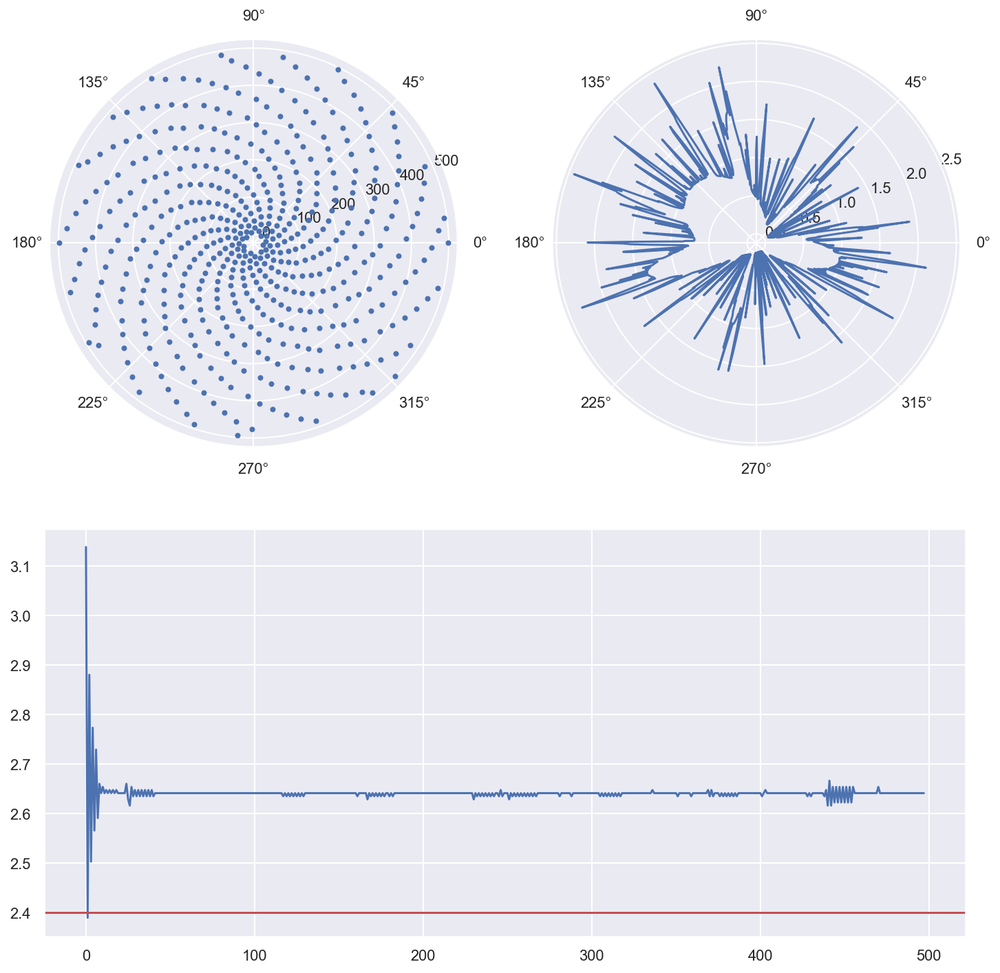

In [24]:
test(a=3, b=3, M=1000)

Final angle 2.764868269511217


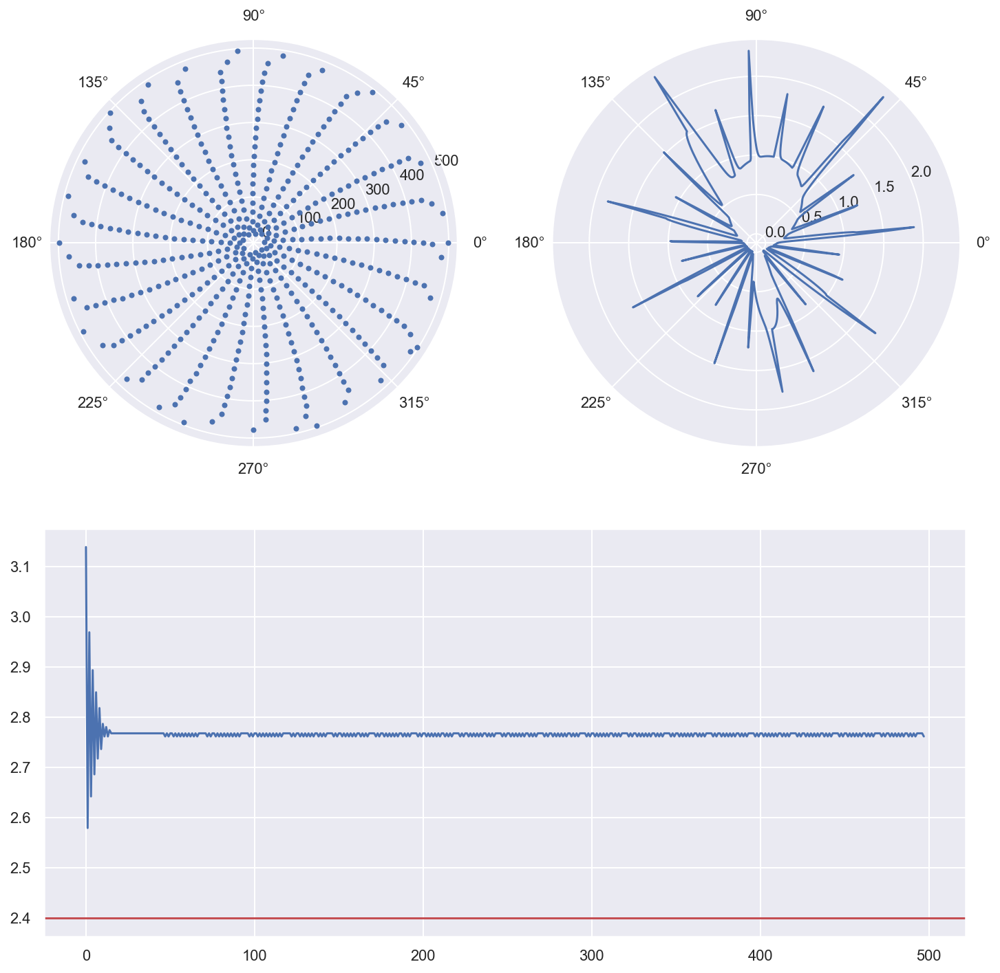

In [25]:
test(a=4, b=4, M=1000)

Final angle 2.8617299699936543


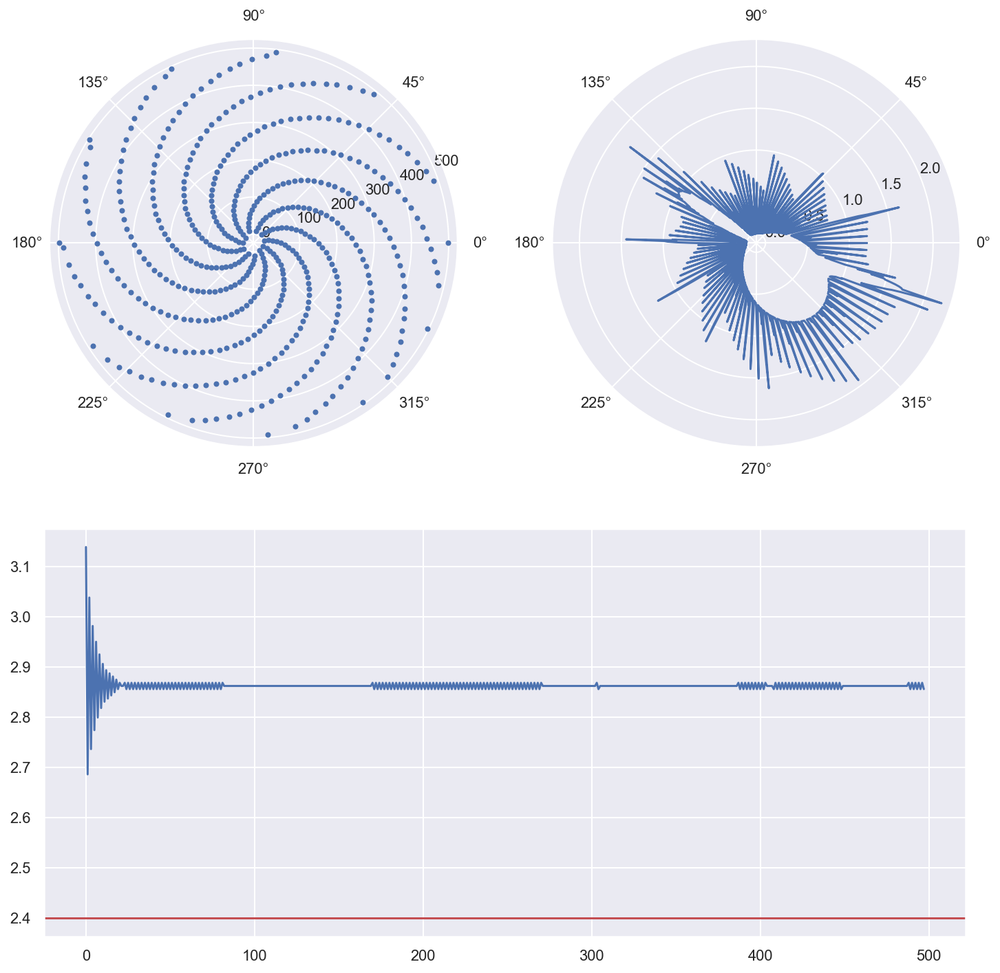

In [26]:
test(a=3, b=5, M=1000)

Final angle 2.9358207406932078


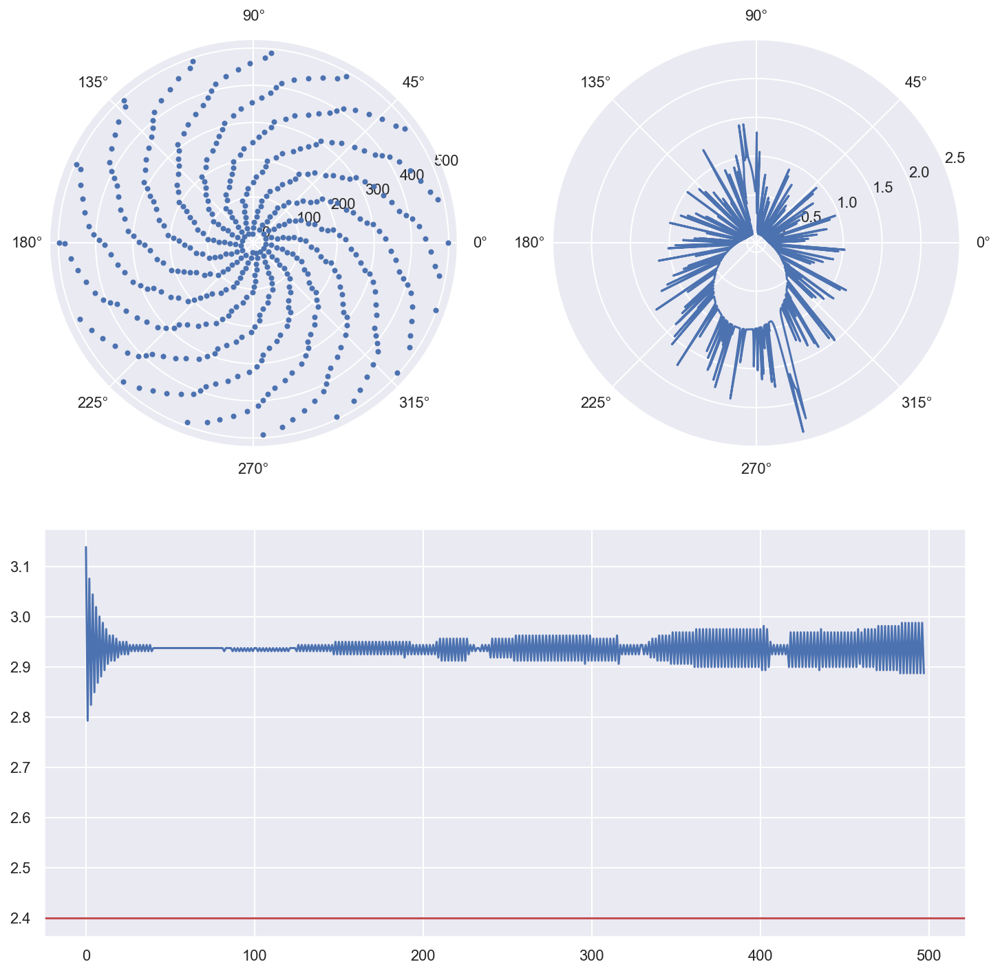

In [27]:
test(a=3, b=6, M=1000)

Final angle 2.9905505378169637


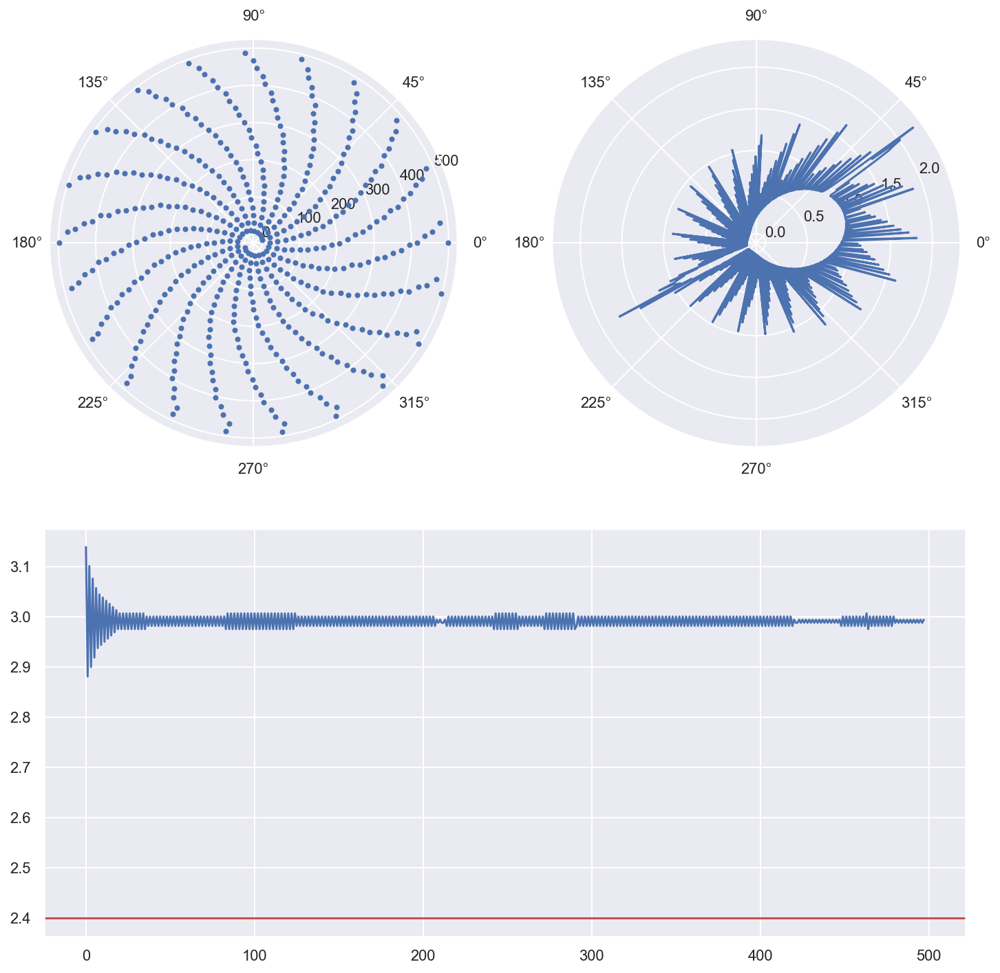

In [28]:
test(a=3, b=7, M=1000)

Final angle 2.9365027319346253


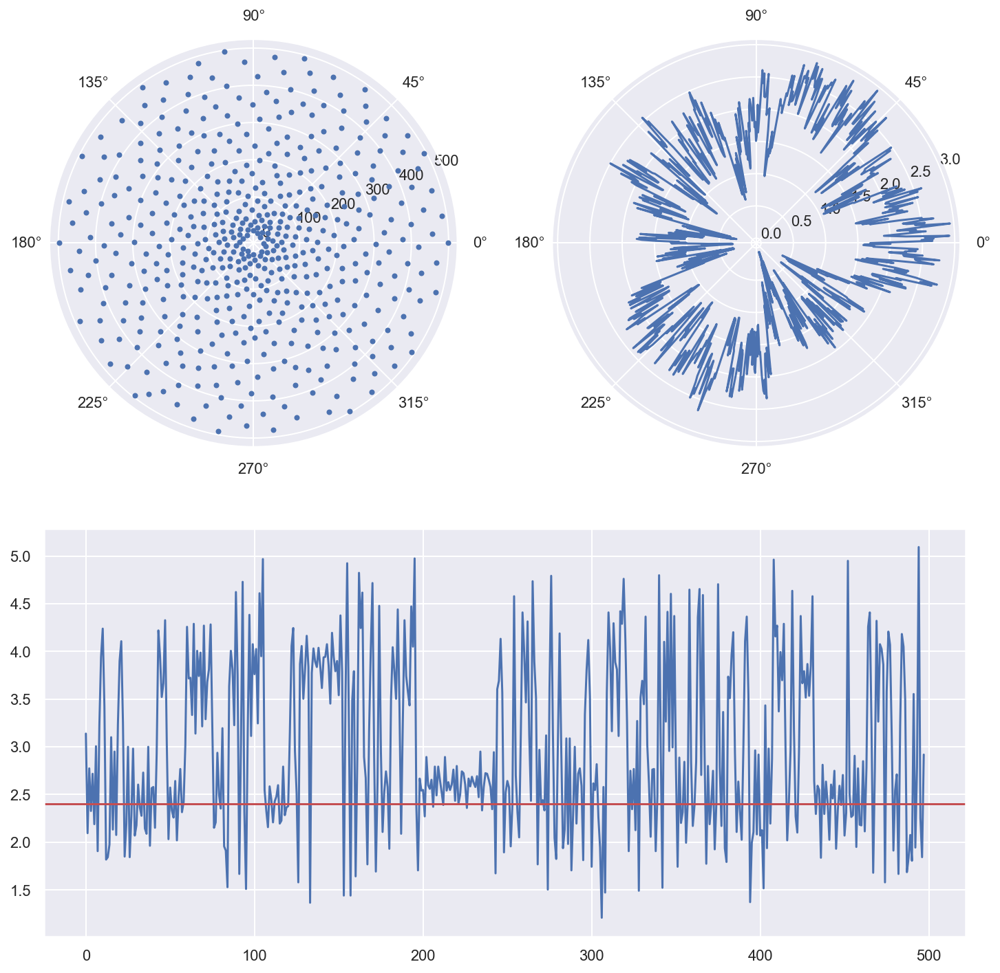

In [29]:
test(a=1, b=2, M=1000)

Final angle 3.060681970476065


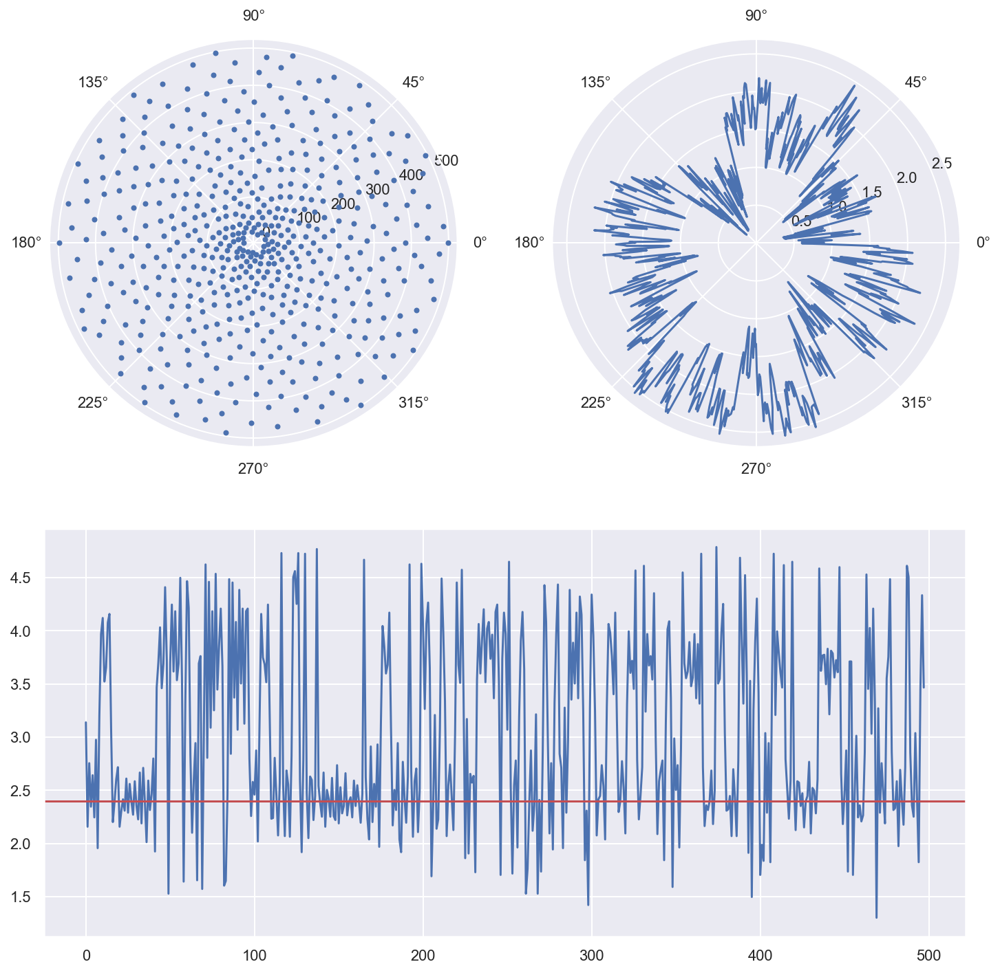

In [30]:
test(a=2, b=2, M=1000)

Final angle 2.400116620559748


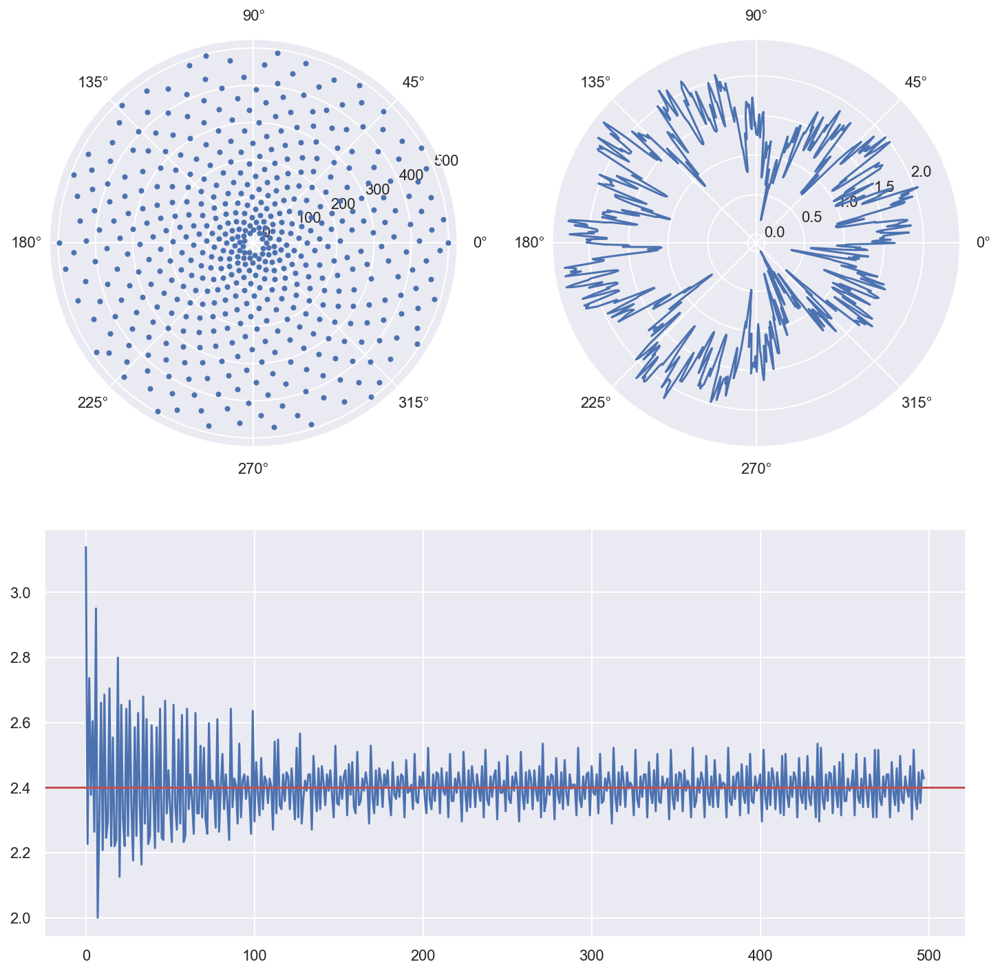

In [31]:
test(a=3, b=2, M=1000)

Final angle 2.399965066950544


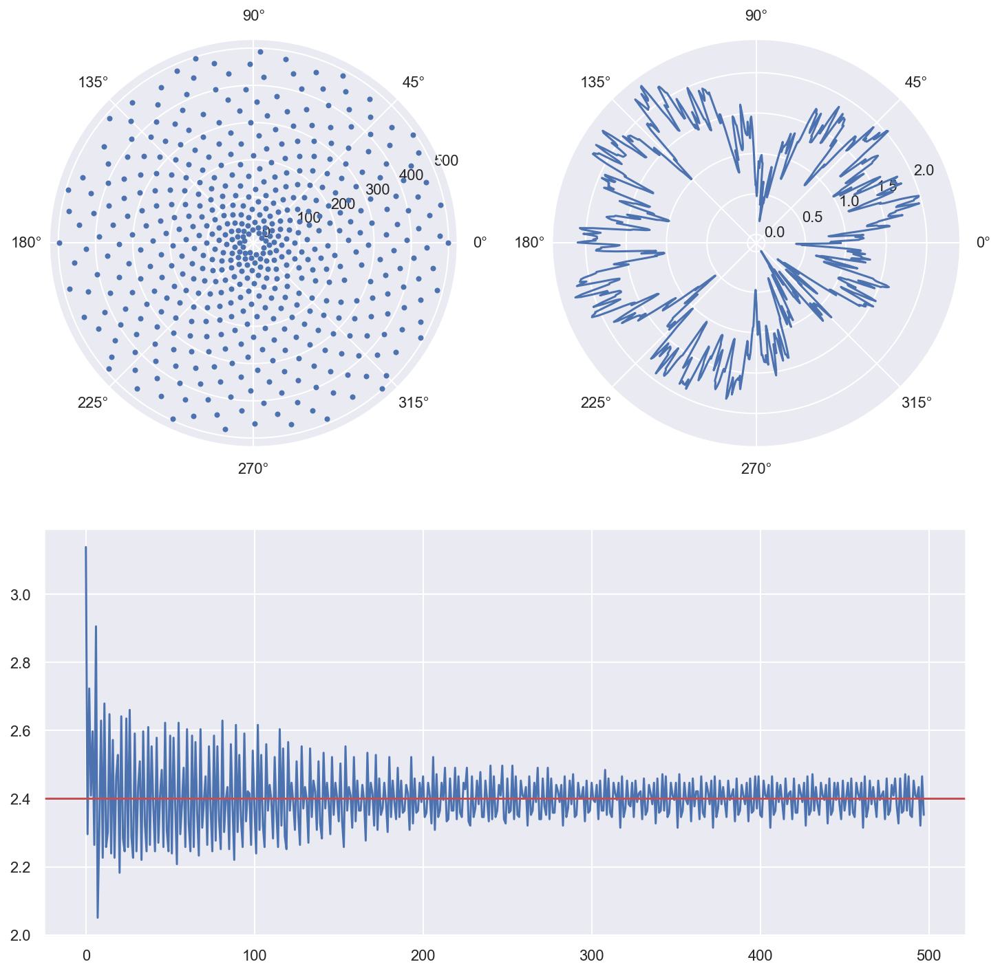

In [32]:
test(a=4, b=2, M=1000)

Final angle 2.6026680192607508


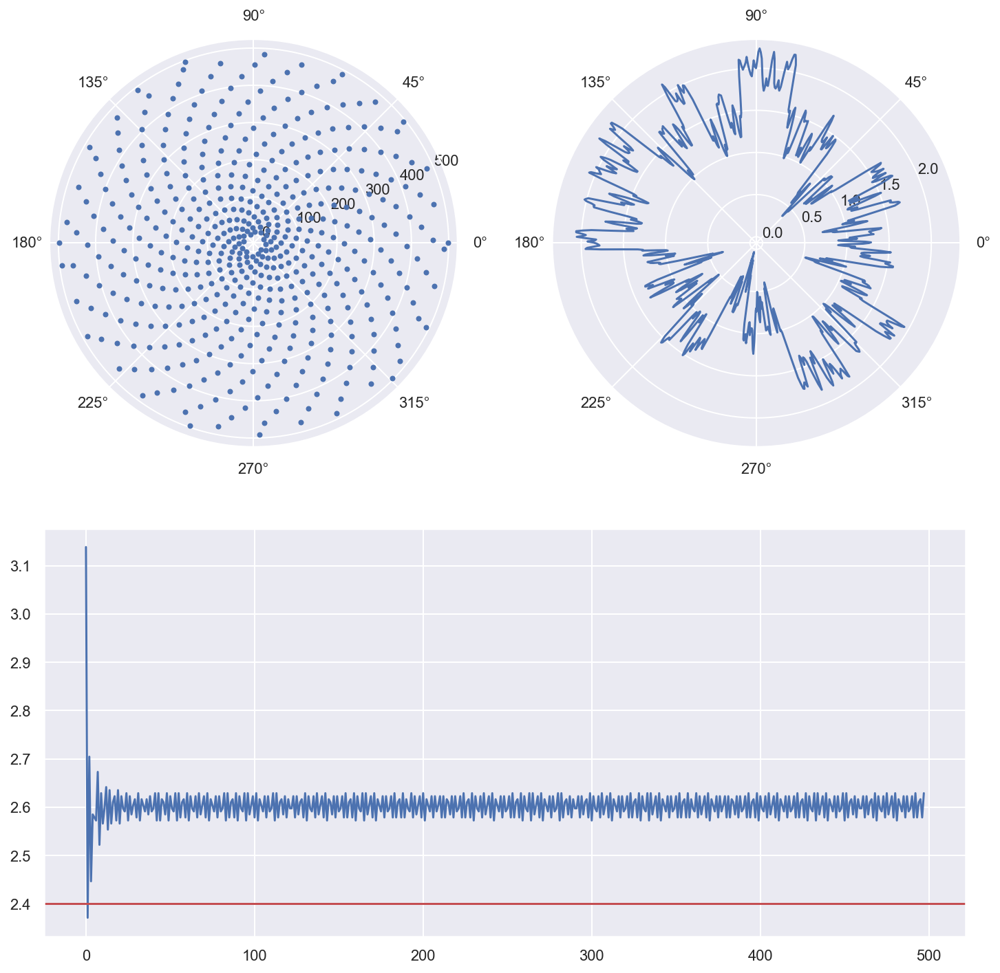

In [33]:
test(a=5, b=2, M=1000)

Final angle 2.6026111866572994


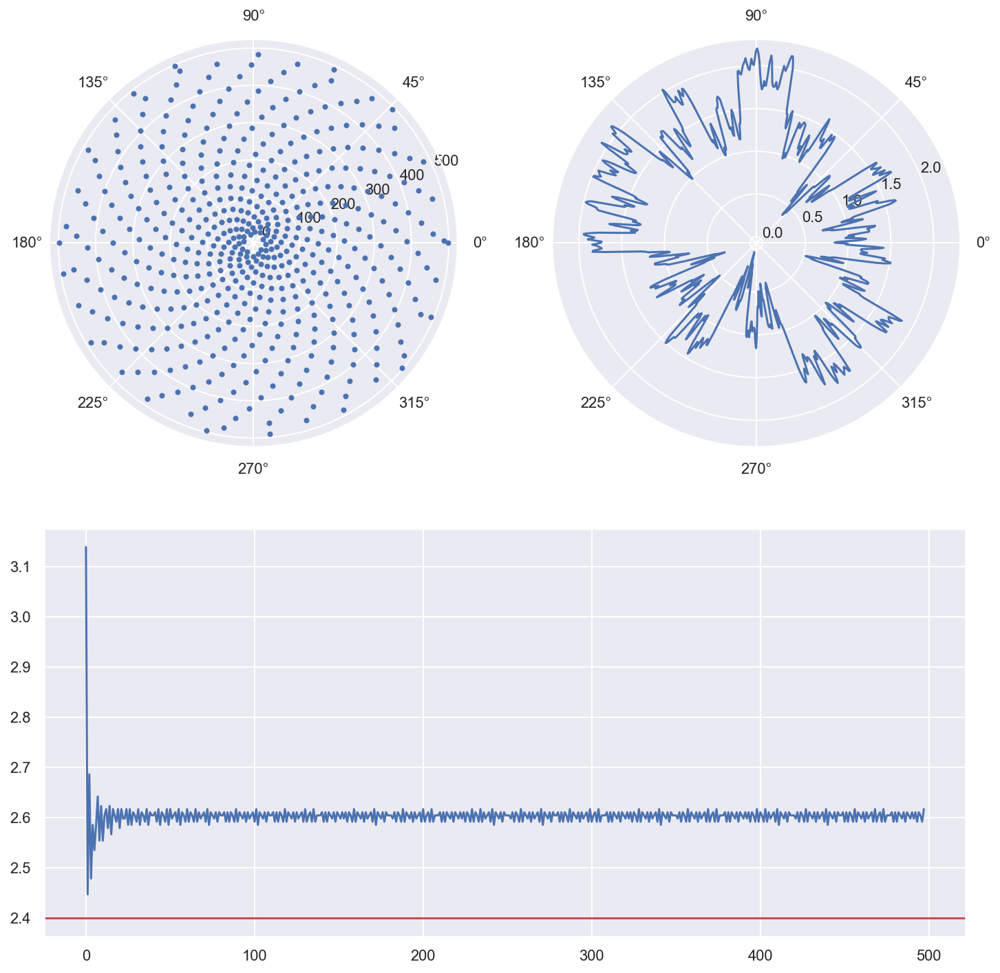

In [34]:
test(a=6, b=2, M=1000)

In [ ]:
def test(a, b, M=1000):
    seeds = np.array([rect(1, 0)])
    x = np.linspace(0, 2*np.pi, M)
    
    def energy(x, a=1, b=2):
        N = len(seeds)
        i = np.r_['1,2', 1 : N+1].T
        phi = np.angle(seeds)[np.newaxis].T
        E = 1/N**a * (np.sum(i**a * np.exp(-(N - i + 1)**b * (x - phi)**2), axis=0)
                      + np.sum(i**a * np.exp(-(N - i + 1)**b * (x + 2*np.pi - phi)**2), axis=0)
                      + np.sum(i**a * np.exp(-(N - i + 1)**b * (x - 2*np.pi - phi)**2), axis=0))
        return E
    
    for i in range(2, 500):
        seeds += seeds / np.abs(seeds)    # Growing np.exp(-(np.r_[i+1:1:-1]) / 100) * 
        angle = x[np.argmin(energy(x, a=a, b=b))]# + np.random.randn()/100
        seeds = np.hstack((seeds, rect(1, angle)))
    
    ax = plt.subplot(221, projection='polar')
    ax.plot(np.angle(seeds), np.abs(seeds), ".")
    
    ax = plt.subplot(222, projection='polar')
    E = np.exp(1j * x) * energy(x, a=a, b=b)
    ax.plot(np.angle(E), np.abs(E))
    
    ax = plt.subplot(212)
    angles = (np.diff(np.angle(seeds)) + 2*np.pi) % (2*np.pi)
    ax.plot(angles)
    ax.axhline(np.pi*(3 - 5**.5), color='r')
    
    print("Final angle", angles[int(len(angles)/3):].mean())

In [347]:
seeds = np.array([rect(1, 0)])
for i in range(200):
    seeds += seeds / np.abs(seeds)    # Growing np.exp(-(np.r_[i+1:1:-1]) / 100) * 
    angle = np.angle(seeds[-1]) + np.pi*(3 - 5**.5)# + np.random.randn()/100
    seeds = np.hstack((seeds, rect(1, angle)))
seeds += seeds / np.abs(seeds)

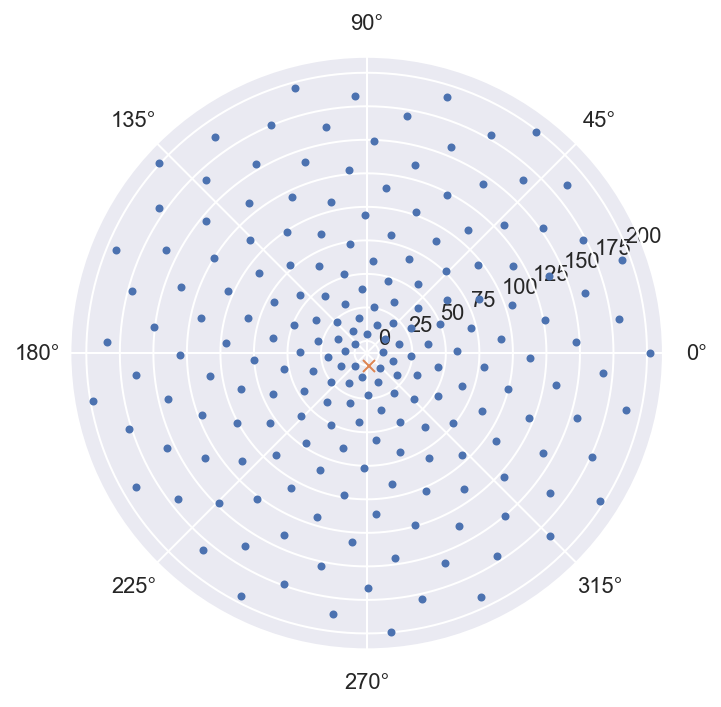

In [348]:
ax = plt.subplot(221, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), ".")
ax.plot(np.angle(seeds[-1]) + np.pi*(3 - 5**.5), 1, "x")

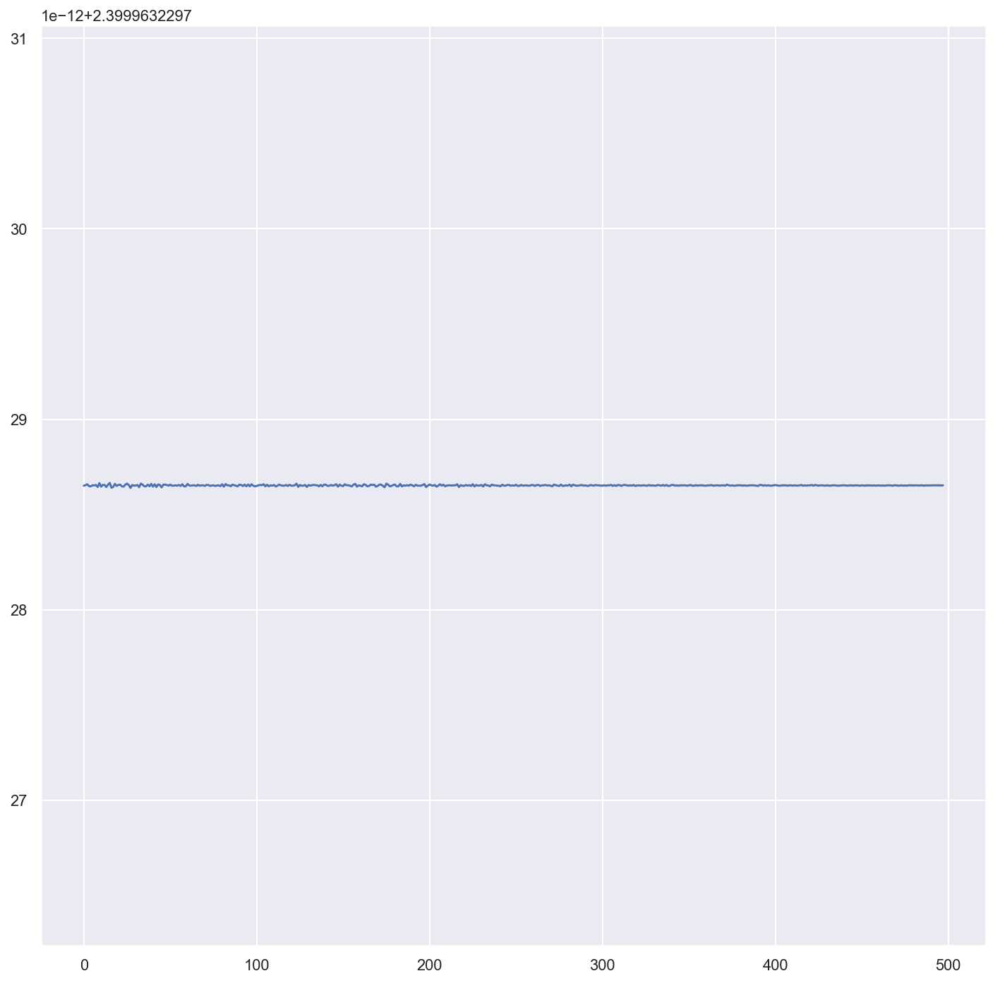

In [72]:
plt.plot((np.diff(np.angle(seeds)) + 2*np.pi) % (2*np.pi))

In [415]:
from ipywidgets import interactive
def plot(a, b):
    def energy(x, a=a, b=b):
        N = len(seeds)
        Z = N
        i = np.r_['0,2', N-Z:N].T
        phi = (np.angle(seeds)[-Z:][np.newaxis].T + 2*np.pi) % (2*np.pi)
        s = (1 - i/N)
        E = (np.sum(np.exp(-((x - phi))**2) / s, axis=0)
            + np.sum(np.exp(-((x + 2*np.pi - phi))**2) / s, axis=0)
            + np.sum(np.exp(-((x + 4*np.pi - phi))**2) / s, axis=0)
            + np.sum(np.exp(-((x - 2*np.pi - phi))**2) / s, axis=0)
            + np.sum(np.exp(-((x - 4*np.pi - phi))**2) / s, axis=0)) / N
        return E

    plt.figure(0)
    plt.plot(np.linspace(0*np.pi, 2*np.pi, 5000), energy(np.linspace(0*np.pi, 2*np.pi, 5000)))
    plt.axvline((np.angle(seeds)[-1] + np.pi*(3 - 5**.5)) % (2*np.pi), color='g')
    plt.plot((np.angle(seeds[-10:]) + 2*np.pi) % (2*np.pi), np.r_[:len(seeds[-10:])], 'rx')
    plt.axvline((np.linspace(0*np.pi, 2*np.pi, 5000)[np.argmin(energy(np.linspace(0*np.pi, 2*np.pi, 5000)))] + 2*np.pi) % (2*np.pi), color='k')
    
interactive_plot = interactive(plot, a=0, b=0)
output = interactive_plot.children[-1]
interactive_plot

interactive(children=(IntSlider(value=0, description='a', max=1), IntSlider(value=0, description='b', max=1), …

In [314]:
(np.linspace(-1*np.pi, 3*np.pi, 5000)[np.argmin(energy(np.linspace(-1*np.pi, 3*np.pi, 5000)))] + 2*np.pi) % (2*np.pi)

4.82330938513736

In [309]:
energy(2.9823574389638594)

array([58.41872603])

In [310]:
energy(2)

array([56.29309172])

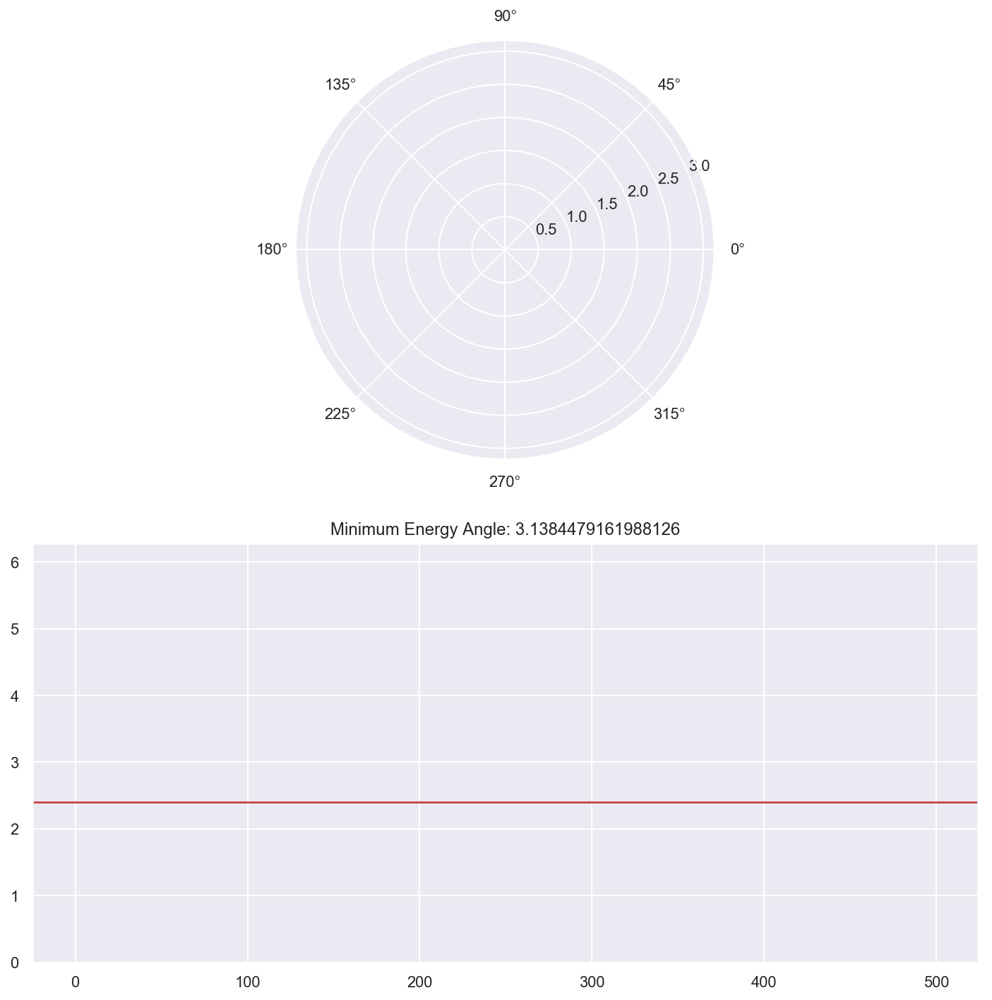

In [115]:
x = np.linspace(0, 2*np.pi, 1000)
a = np.full(500, np.nan)
i = np.arange(500)

def energy(x, a=2, b=-2):
    N = float(len(seeds))
    i = np.r_['1,2', 1 : N+1].T
    phi = np.angle(seeds)[np.newaxis].T
    E = 1/N**a * (np.sum(i**a * np.exp(-(N - i + 1)**b * (x - phi)**2), axis=0)
                  + np.sum(i**a * np.exp(-(N - i + 1)**b * (x + 2*np.pi - phi)**2), axis=0)
                  + np.sum(i**a * np.exp(-(N - i + 1)**b * (x - 2*np.pi - phi)**2), axis=0))
    return E

fig = plt.figure()#, (ax1, ax2) = plt.subplots(2)
ax1 = fig.add_subplot(211, projection='polar')
ln1, = ax1.plot(x, 3*np.ones(x.shape))
ax2 = fig.add_subplot(212)
ax2.set_ylim(0, 2*np.pi)
ax2.axhline(np.pi*(3 - 5**.5), color='r')
ln2, = ax2.plot(i, np.zeros(500))

def draw(t):
    global a
    E = np.exp(1j * x) * energy(x, b=-2+t/100)
    ln1.set_data(np.angle(E), np.abs(E))
    ax2.set_title(f"Minimum Energy Angle: {x[np.argmin(E)] - np.angle(E)[-1]}")
    a[t] = x[np.argmin(E)] - np.angle(E)[-1]
    ln2.set_data(i, a)
    return ln1, ln2

anim = FuncAnimation(fig, draw, 400, interval=50, blit=True)
mpl.rc('animation', html='html5')

In [116]:
anim

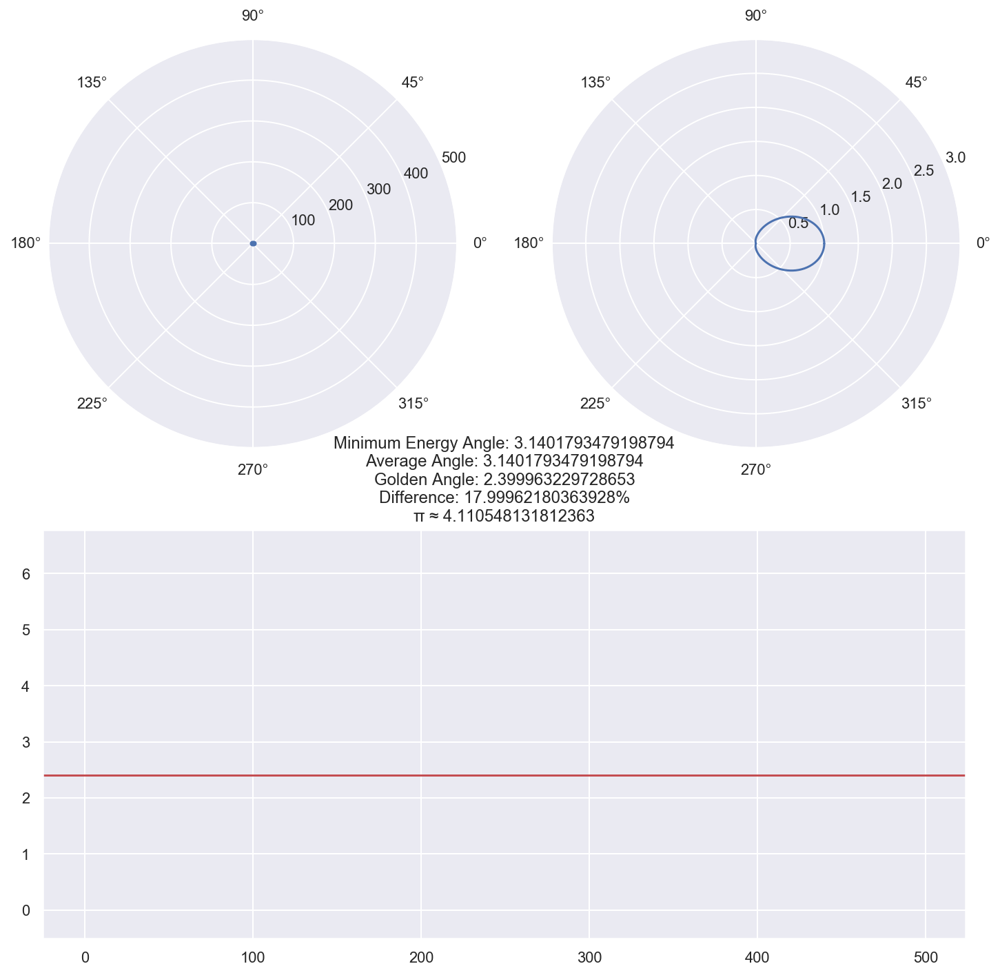

In [74]:
def curvedspace(a, b, x, num=50):
    s = np.linspace(np.cbrt(a - x), np.cbrt(b - x), num)
    return s**3 + x

x = curvedspace(0, 2*np.pi, np.pi*(3 - 5**.5), 1000)
a = np.full(500, np.nan)
i = np.arange(500)
seeds = np.array([rect(1, 0)])

fig = plt.figure()#, (ax1, ax2) = plt.subplots(2)
ax0 = plt.subplot(221, projection='polar')
ax0.set_ylim(0, 500)
ln0, = ax0.plot(np.angle(seeds), np.abs(seeds), ".")
ax1 = fig.add_subplot(222, projection='polar')
ax1.set_ylim(0, 3)
ln1, = ax1.plot(x, 3*np.ones(x.shape))
ax2 = fig.add_subplot(212)
ax2.set_ylim(-.5, 2*np.pi + .5)
ax2.axhline(np.pi*(3 - 5**.5), color='r')
ln2, = ax2.plot(i, np.zeros(500))

#def energy(x, a=2, b=2):
#    N = float(len(seeds))
#    i = np.r_['1,2', 1 : N+1].T
#    phi = np.angle(seeds)[np.newaxis].T
#    E = 1/N**a * (np.sum(i**a * np.exp(-(N - i + 1)**b * (x - phi)**2), axis=0)
#                  + np.sum(i**a * np.exp(-(N - i + 1)**b * (x + 2*np.pi - phi)**2), axis=0)
#                  + np.sum(i**a * np.exp(-(N - i + 1)**b * (x - 2*np.pi - phi)**2), axis=0))
#    return E

#def energy(x, a=1, b=0):
#    N = float(len(seeds))
#    i = np.r_['0,2', :N].T
#    phi = (np.angle(seeds)[np.newaxis].T + 2*np.pi) % (2*np.pi)
#    s = ((N - i) / N)**b
#    print(s)
#    E = 1/N**a * (np.sum(i**a * np.exp(-((x - phi) / s)**2) / s, axis=0)
#                  + np.sum(i**a * np.exp(-((x + 2*np.pi - phi) / s)**2) / s, axis=0)
#                  + np.sum(i**a * np.exp(-((x + 4*np.pi - phi) / s)**2) / s, axis=0)
#                  + np.sum(i**a * np.exp(-((x - 2*np.pi - phi) / s)**2) / s, axis=0)
#                  + np.sum(i**a * np.exp(-((x - 4*np.pi - phi) / s)**2) / s, axis=0))
#    return E

def energy(x):
    N = len(seeds)
    Z = N
    i = np.r_['0,2', N-Z:N].T
    phi = (np.angle(seeds)[-Z:][np.newaxis].T + 2*np.pi) % (2*np.pi)
    s = (1 - i/N)
    E = (np.sum(np.exp(-(x - phi)**2) / s, axis=0)
        + np.sum(np.exp(-(x + 2*np.pi - phi)**2) / s, axis=0)
        + np.sum(np.exp(-(x + 4*np.pi - phi)**2) / s, axis=0)
        + np.sum(np.exp(-(x - 2*np.pi - phi)**2) / s, axis=0)
        + np.sum(np.exp(-(x - 4*np.pi - phi)**2) / s, axis=0)) / N
    return E

from textwrap import dedent as dd

def draw(t):
    global a, seeds
    E = np.exp(1j * x) * energy(x)
    seeds += seeds / np.abs(seeds)    # Growing np.exp(-(np.r_[i+1:1:-1]) / 100) * 
    angle = x[np.argmin(energy(x))]# + np.random.randn()*np.pi/50
    seeds = np.hstack((seeds, rect(1, angle)))
    ln0.set_data(np.angle(seeds), np.abs(seeds))
    ln1.set_data(np.angle(E), np.abs(E))
    angle = (angle - np.angle(seeds)[-2] + 2*np.pi) % (2*np.pi)
    average = ((np.diff(np.angle(seeds)) + 2*np.pi) % (2*np.pi)).mean()
    ax2.set_title(dd(f"""\
        Minimum Energy Angle: {angle}
        Average Angle: {average}
        Golden Angle: {np.pi*(3 - 5**.5)}
        Difference: {abs(average - np.pi*(3 - 5**.5)) / np.pi*(3 - 5**.5) * 100}%
        π ≈ {average/(3 - 5**.5)}"""))
    a[t] = angle
    ln2.set_data(i, a)
    return ln1, ln2, ln0

anim = FuncAnimation(fig, draw, 500, interval=50, blit=True)
mpl.rc('animation', html='html5')

In [77]:
anim

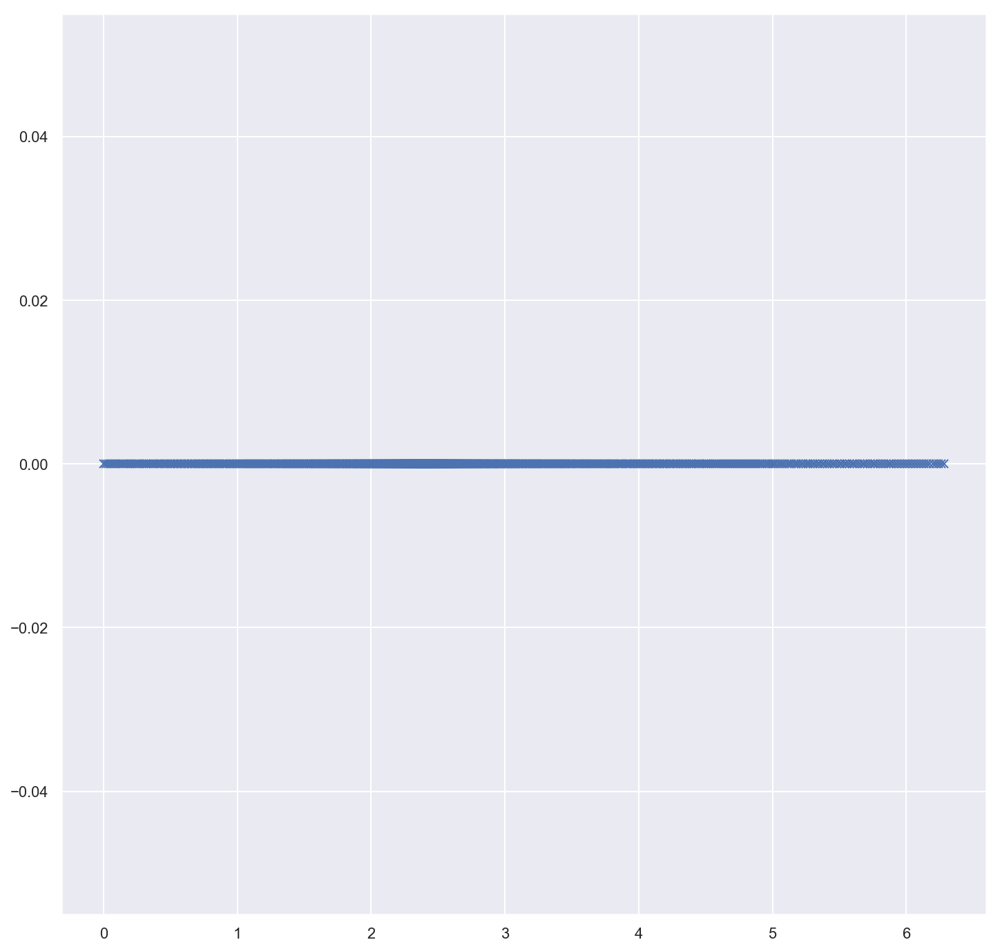

In [49]:
def curvedspace(a, b, x, num=50):
    s = np.linspace(np.cbrt(a - x), np.cbrt(b - x), num)
    return s**3 + x

plt.plot(curvedspace(0, 2*np.pi, np.pi*(3 - 5**.5), 1000), np.zeros(1000), 'x')

In [3]:
%%capture

seeds = np.array([rect(1, 0)])

fig = plt.figure(figsize=(8, 8), dpi=300)

ax0 = fig.add_subplot(111, projection='polar')
ax0.set_ylim(0, 500)
ln0, = ax0.plot(np.angle(seeds), np.abs(seeds), ".")

def draw(t):
    global seeds
    
    seeds += seeds / np.abs(seeds)    # Growing
    angle = np.angle(seeds[-1]) + np.pi*(3 - 5**.5)
    seeds = np.hstack((seeds, rect(1, angle)))
    
    ln0.set_data(np.angle(seeds), np.abs(seeds))
    return ln0,

anim = FuncAnimation(fig, draw, 500, interval=50, blit=True)
anim.save("golden.mp4")

In [29]:
%%capture
seeds = np.array([rect(1, 0)])

fig = plt.figure(figsize=(8, 8), dpi=300)

ax0 = fig.add_subplot(111, projection='polar')
ax0.set_ylim(0, 500)
ln0, = ax0.plot(np.angle(seeds), np.abs(seeds), ".")

def draw(t):
    global seeds
    
    seeds += seeds / np.abs(seeds)    # Growing
    angle = np.angle(seeds[-1]) + np.random.rand()*2*np.pi
    seeds = np.hstack((seeds, rect(1, angle)))
    
    ln0.set_data(np.angle(seeds), np.abs(seeds))
    return ln0,

anim = FuncAnimation(fig, draw, 500, interval=50, blit=True)
anim.save("random_big.mp4")

In [6]:
%%capture
seeds = np.array([rect(1, 0)])

fig = plt.figure(figsize=(8, 8), dpi=300)

ax0 = fig.add_subplot(111, projection='polar')
ax0.set_ylim(0, 20)
ax0.plot(np.linspace(0, 2*np.pi, 360), np.ones(360), 'r', label="Meristem")
ln0, = ax0.plot(np.angle(seeds), np.abs(seeds), ".", label="Seeds")

fig.legend()

def draw(t):
    global seeds
    
    seeds += seeds / np.abs(seeds)    # Growing
    angle = np.angle(seeds[-1]) + np.random.rand()*2*np.pi
    seeds = np.hstack((seeds, rect(1, angle)))
    
    ln0.set_data(np.angle(seeds), np.abs(seeds))
    return ln0,

anim = FuncAnimation(fig, draw, 20, interval=300, blit=True)
anim.save("random_small.mp4")

In [34]:
%%capture
seeds = np.array([rect(1, 0)])

fig = plt.figure(figsize=(8, 8), dpi=300)

ax0 = fig.add_subplot(111, projection='polar')
ax0.set_ylim(0, 20)
ax0.plot(np.linspace(0, 2*np.pi, 360), np.ones(360), 'r', label="Meristem")
ln0, = ax0.plot(np.angle(seeds), np.abs(seeds), ".", label="Seeds")

fig.legend()

def draw(t):
    global seeds
    
    seeds += seeds / np.abs(seeds)    # Growing
    angle = np.angle(seeds[-1]) + np.pi*(3 - 5**.5)
    seeds = np.hstack((seeds, rect(1, angle)))
    
    ln0.set_data(np.angle(seeds), np.abs(seeds))
    return ln0,

anim = FuncAnimation(fig, draw, 20, interval=300, blit=True)
anim.save("golden_small.mp4")

In [7]:
%%capture
seeds = np.array([rect(1, 0)])

fig = plt.figure(figsize=(8, 4), dpi=300)

ax0 = fig.add_subplot(121, projection='polar')
ax0.set_ylim(0, 20)
ax0.plot(np.linspace(0, 2*np.pi, 360), np.ones(360), 'r', label="Meristem")
ln0, = ax0.plot(np.angle(seeds), np.abs(seeds), ".", label="Seeds")
ax1 = fig.add_subplot(122, projection='polar')
ax1.set_ylim(0, 500)
ln1, = ax1.plot(np.angle(seeds), np.abs(seeds), ".")

fig.legend()

def draw(t):
    global seeds
    
    seeds += seeds / np.abs(seeds)    # Growing
    angle = np.angle(seeds[-1])
    seeds = np.hstack((seeds, rect(1, angle)))
    
    ln0.set_data(np.angle(seeds), np.abs(seeds))
    ln1.set_data(np.angle(seeds), np.abs(seeds))
    return ln0, ln1

anim = FuncAnimation(fig, draw, 500, interval=300, blit=True)
anim.save("same_both.mp4")

In [9]:
%%capture
seeds = np.array([rect(1, 0)])

fig = plt.figure(figsize=(8, 8), dpi=300)

ax0 = fig.add_subplot(111, projection='polar')
ax0.set_ylim(0, 20)
ax0.plot(np.linspace(0, 2*np.pi, 360), np.ones(360), 'r', label="Meristem")
ln0, = ax0.plot(np.angle(seeds), np.abs(seeds), ".", label="Seeds")

fig.legend()

def draw(t):
    global seeds
    
    seeds += seeds / np.abs(seeds)    # Growing
    angle = np.angle(seeds[-1])
    seeds = np.hstack((seeds, rect(1, angle)))
    
    ln0.set_data(np.angle(seeds), np.abs(seeds))
    return ln0,

anim = FuncAnimation(fig, draw, 20, interval=300, blit=True)
anim.save("same_small.mp4")